In [2]:
# Import Required Libraries
import numpy as np
import matplotlib.pyplot as plt
import requests

# To unzip the edf_dataset
import zipfile
import os

# EDFlib and Data Preprocesing module
from mne.preprocessing import ICA, create_eog_epochs
import mne
from pyedflib import highlevel
import pyedflib as plib

In [2]:
import requests


def download_file(url, save_path):

    # Check if the file already exists
    if os.path.exists(save_path):
        print(f"File already exists at '{save_path}'. Skipping download.")
        return  # Exit the function if the file exists

    # Send a GET request to the URL
    response = requests.get(url)

    # Check if the request was successful
    if response.status_code == 200:
        # Open the file in binary write mode and save the content
        with open(save_path, 'wb') as file:
            file.write(response.content)
        print(f"File downloaded successfully and saved to '{save_path}'")
    else:
        print(f"Failed to download file. Status code: {response.status_code}")


# Specify the URL and the path where you want to save the file
url = 'https://figshare.com/ndownloader/articles/4244171/versions/2'
# Change this to your desired path
save_path = './edf_dataset.zip'

# Call the function to download the file
download_file(url, save_path)

File already exists at './edf_dataset.zip'. Skipping download.


In [3]:
def unzip_file(zip_file_path, extract_to_folder):

    # Check if the directory exist

    if os.path.exists(extract_to_folder):
        print(f"Directory '{extract_to_folder} already exists")
        return  # Exit the function if the directory

    # Create the directory if it doesn't exist
    os.makedirs(extract_to_folder, exist_ok=True)

    # Open the zip file
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        # Extract all the contents into the specified folder
        zip_ref.extractall(extract_to_folder)


# Specify the path to the zip file and the extraction folder
zip_file_path = './edf_dataset.zip'
# Change this if needed
extract_to_folder = './edf_dataset_2'

# Call the function to unzip
unzip_file(zip_file_path, extract_to_folder)


Directory './edf_dataset_2 already exists


In [4]:
import os
import re  # Import the regular expressions module

# edf_directory
edf_directory = "./edf_dataset_2"
# Loop through all files in the specified directory
for filename in os.listdir(edf_directory):
    # Check if the filename contains spaces
    if ' ' in filename:
        # Create a new filename by replacing multiple spaces with a single underscore
        # Replace one or more spaces with a single underscore
        new_filename = re.sub(r'\s+', '_', filename)

        # Get the full path for the old and new filenames
        old_file = os.path.join(edf_directory, filename)
        new_file = os.path.join(edf_directory, new_filename)

        # Rename the file
        os.rename(old_file, new_file)
        print(f'Renamed: "{filename}" to "{new_filename}"')
    elif '6931959' in filename:
        new_filename = filename.replace('6921959_', '')

        # Get the full path for the old and new filenames
        old_file = os.path.join(edf_directory, filename)
        new_file = os.path.join(edf_directory, new_filename)

        # Rename the file
        os.rename(old_file, new_file)
        print(f'Renamed: "{filename}" to "{new_filename}"')
    elif '6921143' in filename:
        new_filename = filename.replace('6921143_', '')
        # Get the full path for the old and new filenames
        old_file = os.path.join(edf_directory, filename)
        new_file = os.path.join(edf_directory, new_filename)

        # Rename the file
        os.rename(old_file, new_file)
        print(f'Renamed: "{filename}" to "{new_filename}"')
print("Renaming complete.")

Renaming complete.


# Exploratory Data Analysis 

In [5]:
filtered_healthy_ec = bandpass_filter(healthy_ec_data, 0.5, 60.0)
filtered_mdd_ec = bandpass_filter(mdd_ec_data, 0.5, 60.0)
filtered_healthy_eo = bandpass_filter(healthy_eo_data, 0.5, 60.0)
filtered_mdd_eo = bandpass_filter(mdd_eo_data, 0.5, 60.0)
filtered_healthy_task = bandpass_filter(healthy_task_data, 0.5, 60.0)
filtered_mdd_task = bandpass_filter(mdd_task_data, 0.5, 60.0)

NameError: name 'bandpass_filter' is not defined

In [6]:
import random

# Directory containing the EDF files
edf_directory = "./edf_dataset_2"

# Initialize lists for each category
healthy_task_files = []
healthy_ec_files = []
healthy_eo_files = []
mdd_task_files = []
mdd_ec_files = []
mdd_eo_files = []

# Loop through all files in the specified directory
for filename in os.listdir(edf_directory):
    if filename.endswith('.edf'):  # Ensure we only process EDF files
        # Categorize files based on their names
        if filename.startswith('H'):
            if filename.endswith('_TASK.edf'):
                healthy_task_files.append(filename)
            elif filename.endswith('EC.edf'):
                healthy_ec_files.append(filename)
            elif filename.endswith('EO.edf'):
                healthy_eo_files.append(filename)
        elif filename.startswith('MDD_'):
            if filename.endswith('TASK.edf'):
                mdd_task_files.append(filename)
            elif filename.endswith('EC.edf'):
                mdd_ec_files.append(filename)
            elif filename.endswith('EO.edf'):
                mdd_eo_files.append(filename)

print(f"Healthy Sample with Task: {len(healthy_task_files)}")
print(f"Healthy Sample with Eyes Closed: {len(healthy_ec_files)}")
print(f"Healthy Sample with Eyes Open: {len(healthy_eo_files)}")
print(f"Mild Depressive Disorder Sample with Task: {len(mdd_task_files)}")
print(
    f"Major Depressive Disorder Sample with Eyes Closed: {len(mdd_ec_files)}")
print(f"Major Depressive Disorder Sample with Eyes Open: {len(mdd_eo_files)}")

Healthy Sample with Task: 28
Healthy Sample with Eyes Closed: 28
Healthy Sample with Eyes Open: 29
Mild Depressive Disorder Sample with Task: 33
Major Depressive Disorder Sample with Eyes Closed: 30
Major Depressive Disorder Sample with Eyes Open: 32


In [7]:
import mne


def load_and_check_channels(file_path):
    # Load the EDF file
    raw = mne.io.read_raw_edf(file_path, preload=True)

    # Access the 'info' attribute
    info = raw.info

    # Extract subject information (birthdate and gender)
    # subject_info = info.get('subject_info', {})

    # birthdate = subject_info.get('birthday', None)
    # gender_code = subject_info.get('sex', None)

    # Gender is coded as: 0 = unknown, 1 = male, 2 = female
    # gender = {0: 'unknown', 1: 'male', 2: 'female'}.get(gender_code, 'unknown')

    # Load bad channels
    bad_channels = raw.load_bad_channels()
    all_raw_channels = raw.ch_names
    number_of_channels = len(all_raw_channels)

    # Print the information
    print(f"File path: {file_path}")
    print(f"Number of EEG Channels Used: {number_of_channels}")
    print(f"EEG Channels: {all_raw_channels}")
    print(f"Bad Channels: {bad_channels}")
    # print(f"Birthdate: {birthdate}")
    # print(f"Gender: {gender}")

    return raw

In [8]:
# Function to pick a random file from a list
def pick_random_file(file_list):
    return random.choice(file_list) if file_list else None


# Pick one file from each specified combination and store in variables
healthy_task_file = pick_random_file(healthy_task_files)
healthy_ec_file = pick_random_file(healthy_ec_files)
healthy_eo_file = pick_random_file(healthy_eo_files)
mdd_task_file = pick_random_file(mdd_task_files)
mdd_ec_file = pick_random_file(mdd_ec_files)
mdd_eo_file = pick_random_file(mdd_eo_files)

# Now you can access these variables directly
print(f"Healthy and Task: {healthy_task_file}")
print(f"Healthy and EC: {healthy_ec_file}")
print(f"Healthy and EO: {healthy_eo_file}")
print(f"MDD and Task: {mdd_task_file}")
print(f"MDD and EC: {mdd_ec_file}")
print(f"MDD and EO: {mdd_eo_file}")

Healthy and Task: H_S9_TASK.edf
Healthy and EC: H_S9_EC.edf
Healthy and EO: H_S27_EO.edf
MDD and Task: MDD_S20_TASK.edf
MDD and EC: MDD_S34_EC.edf
MDD and EO: MDD_S6_EO.edf


In [9]:
# Load the selected Healthy EDF files
healthy_task_data = load_and_check_channels(
    os.path.join(edf_directory, healthy_task_file))
healthy_ec_data = load_and_check_channels(
    os.path.join(edf_directory, healthy_ec_file))
healthy_eo_data = load_and_check_channels(
    os.path.join(edf_directory, healthy_eo_file))

Extracting EDF parameters from /Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S9_TASK.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 153855  =      0.000 ...   600.996 secs...
No channels updated. Bads are: []
File path: ./edf_dataset_2/H_S9_TASK.edf
Number of EEG Channels Used: 22
EEG Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Bad Channels: None
Extracting EDF parameters from /Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S9_EC.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 77055  =      0.000 ...   300.996 secs...
No channels updated. Bads are: []
File path: ./edf_dataset_2/H_S9_

In [10]:
mdd_task_data = load_and_check_channels(
    os.path.join(edf_directory, mdd_task_file))
mdd_ec_data = load_and_check_channels(os.path.join(edf_directory, mdd_ec_file))
mdd_eo_data = load_and_check_channels(os.path.join(edf_directory, mdd_eo_file))

Extracting EDF parameters from /Users/hansandreanto/Development/capstone-project/edf_dataset_2/MDD_S20_TASK.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 161535  =      0.000 ...   630.996 secs...
No channels updated. Bads are: []
File path: ./edf_dataset_2/MDD_S20_TASK.edf
Number of EEG Channels Used: 22
EEG Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Bad Channels: None
Extracting EDF parameters from /Users/hansandreanto/Development/capstone-project/edf_dataset_2/MDD_S34_EC.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 76287  =      0.000 ...   297.996 secs...
No channels updated. Bads are: []
File path: ./edf_datase

In [11]:
# Extract channel names from each dataset
healthy_task_channels = healthy_task_data.ch_names
healthy_ec_channels = healthy_ec_data.ch_names
healthy_eo_channels = healthy_eo_data.ch_names
mdd_task_channels = mdd_task_data.ch_names
mdd_ec_channels = mdd_ec_data.ch_names
mdd_eo_channels = mdd_eo_data.ch_names

In [14]:
# Function to rename channels and drop specified channels based on conditions
def process_channels(raw_data):
    """
    Process and standardize EEG channels
    """
    print(f"Initial channels: {raw_data.ch_names}")

    # Initialize a list to hold channels to drop
    channels_to_drop = []

    # Create mapping for channel renaming
    rename_map = {}
    for name in raw_data.ch_names:
        if any(x in name for x in ['23A-23R', '24A-24R', 'A2-A1']):
            channels_to_drop.append(name)
        else:
            new_name = name.replace('EEG ', '').replace('-LE', '')
            rename_map[name] = new_name

    # Drop unwanted channels
    if channels_to_drop:
        print(f"Dropping channels: {channels_to_drop}")
        raw_data.drop_channels(channels_to_drop)

    # Rename remaining channels
    raw_data.rename_channels(rename_map)

    print(f"Final channels: {raw_data.ch_names}")

    # Verify we have the expected number of channels (should be 19)
    expected_channels = ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz',
                         'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']

    if len(raw_data.ch_names) != len(expected_channels):
        print(
            f"Warning: Expected {len(expected_channels)} channels, got {len(raw_data.ch_names)}")
        print(f"Missing: {set(expected_channels) - set(raw_data.ch_names)}")

    return raw_data

In [18]:
import matplotlib.pyplot as plt


def plot_data(raw_data):
    # Plot the raw EEG data
    print(f"Plotting: {raw_data.filenames}")
    raw_data.plot(n_channels=17, scalings='auto', title='EDF Data', show=True)

    # Compute and plot the Power Spectral Density (PSD)
    raw_data.plot_psd()

    plt.show()

In [16]:
# Plot the raw data
process_channels(healthy_ec_data)
process_channels(healthy_task_data)
process_channels(healthy_eo_data)
process_channels(mdd_task_data)
process_channels(mdd_ec_data)
process_channels(mdd_eo_data)

Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6'

<RawEDF | MDD_S6_EO.edf, 19 x 77056 (301.0 s), ~11.2 MB, data loaded>

Plotting: ('/Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S9_EC.edf',)
Using matplotlib as 2D backend.
Opening raw-browser...


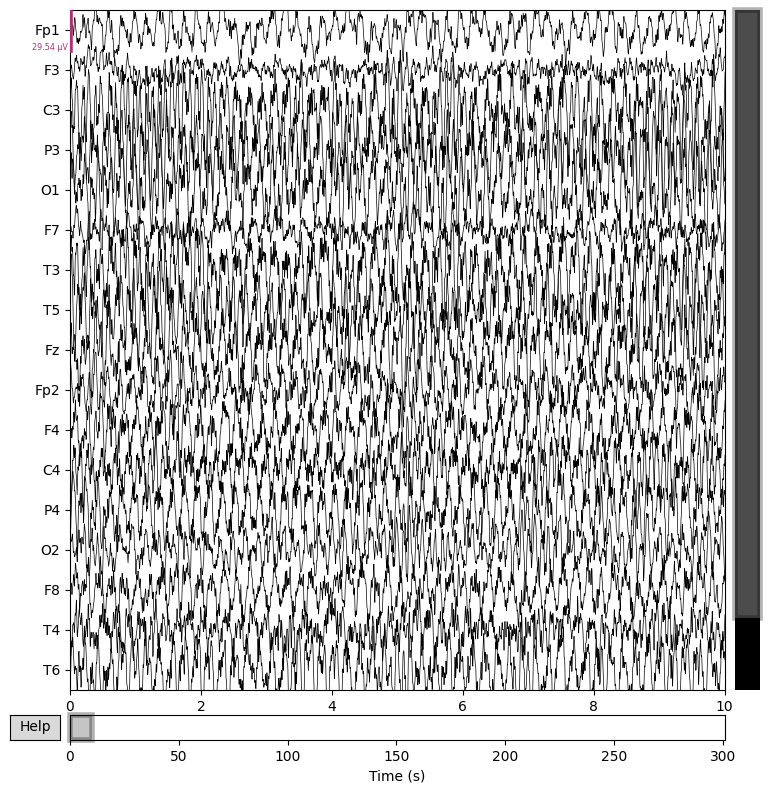

Effective window size : 8.000 (s)


/var/folders/c6/ml47p_317kjcw90pxjg9s7sc0000gn/T/ipykernel_98830/96775085.py:10: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_data.plot_psd()


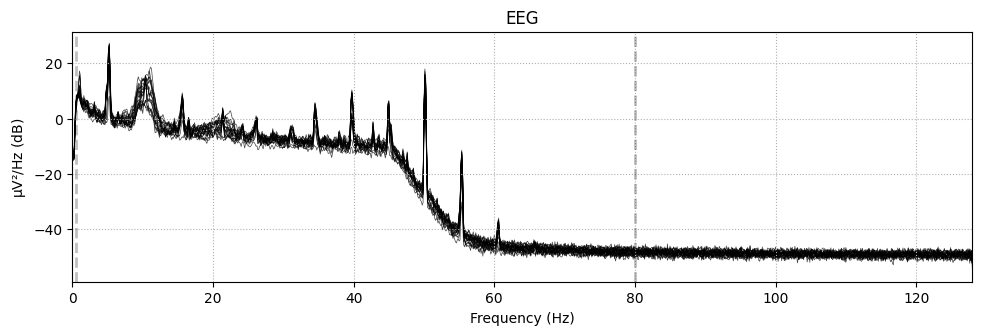

Plotting: ('/Users/hansandreanto/Development/capstone-project/edf_dataset_2/MDD_S34_EC.edf',)
Opening raw-browser...


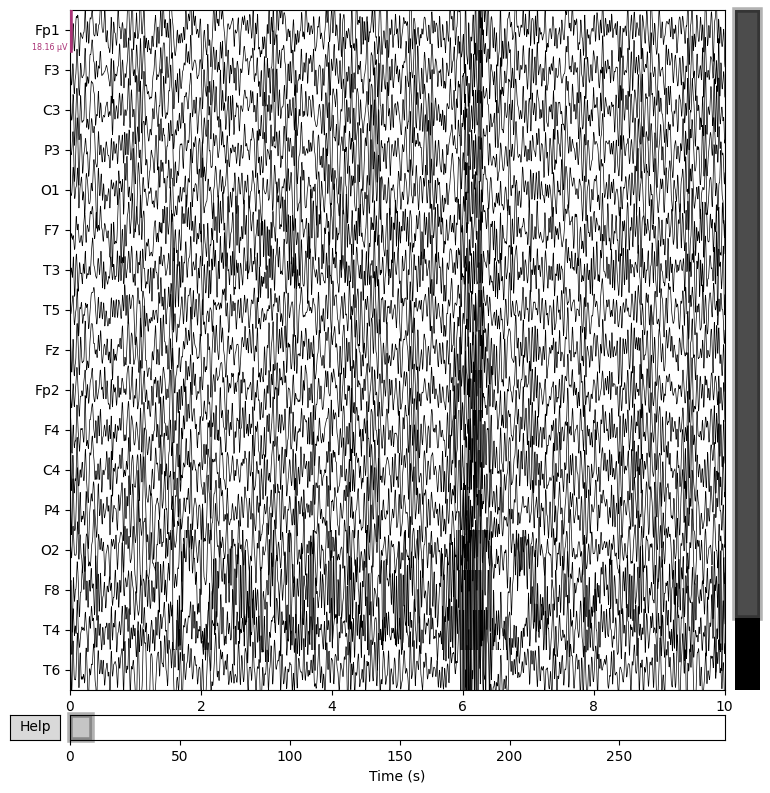

Effective window size : 8.000 (s)


/var/folders/c6/ml47p_317kjcw90pxjg9s7sc0000gn/T/ipykernel_98830/96775085.py:10: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_data.plot_psd()


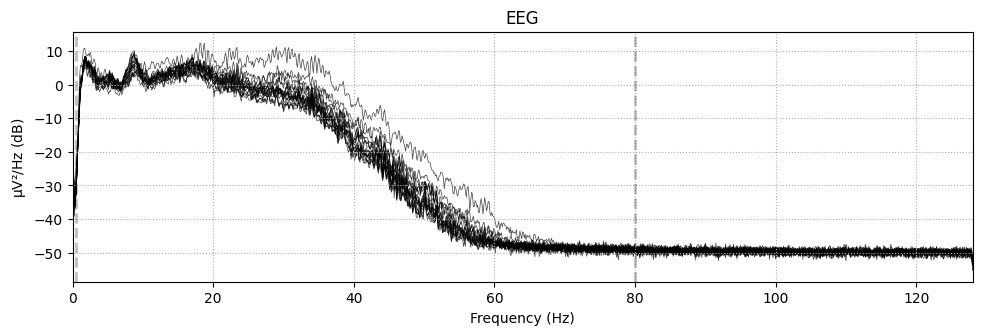

Plotting: ('/Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S27_EO.edf',)
Opening raw-browser...


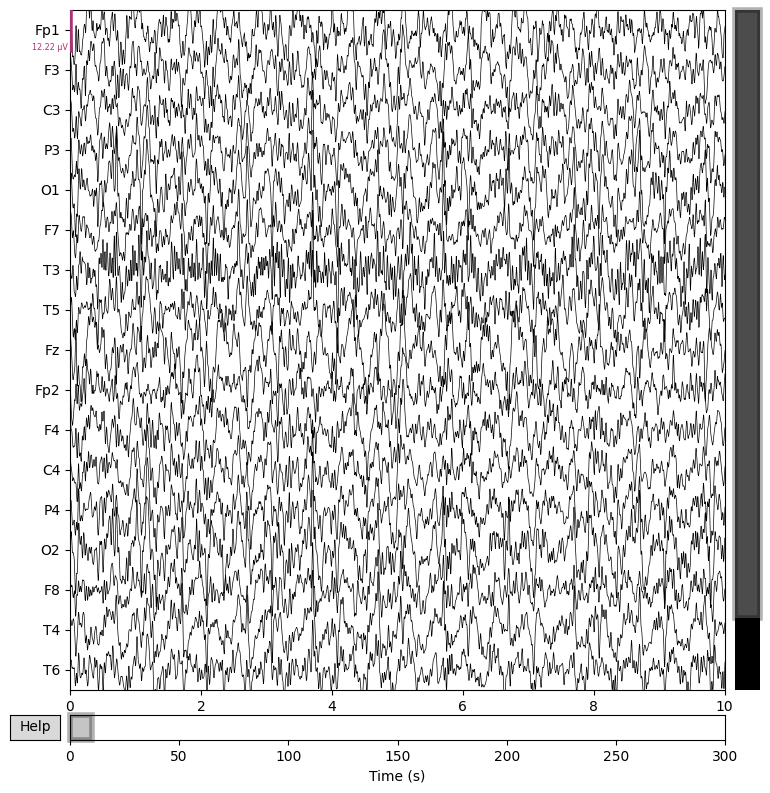

Effective window size : 8.000 (s)


/var/folders/c6/ml47p_317kjcw90pxjg9s7sc0000gn/T/ipykernel_98830/96775085.py:10: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_data.plot_psd()


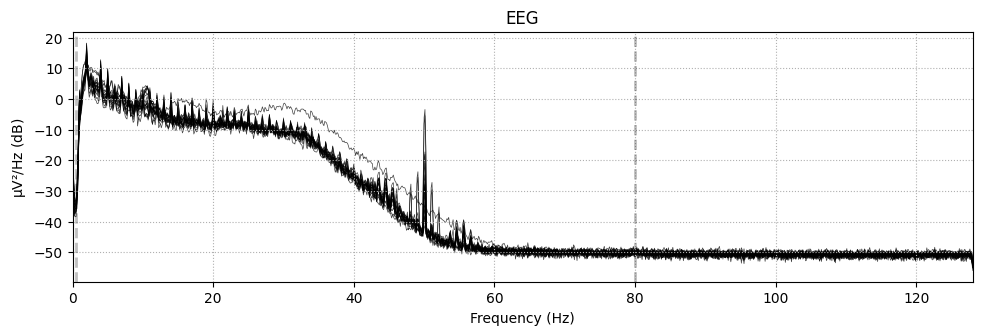

Plotting: ('/Users/hansandreanto/Development/capstone-project/edf_dataset_2/MDD_S6_EO.edf',)
Opening raw-browser...


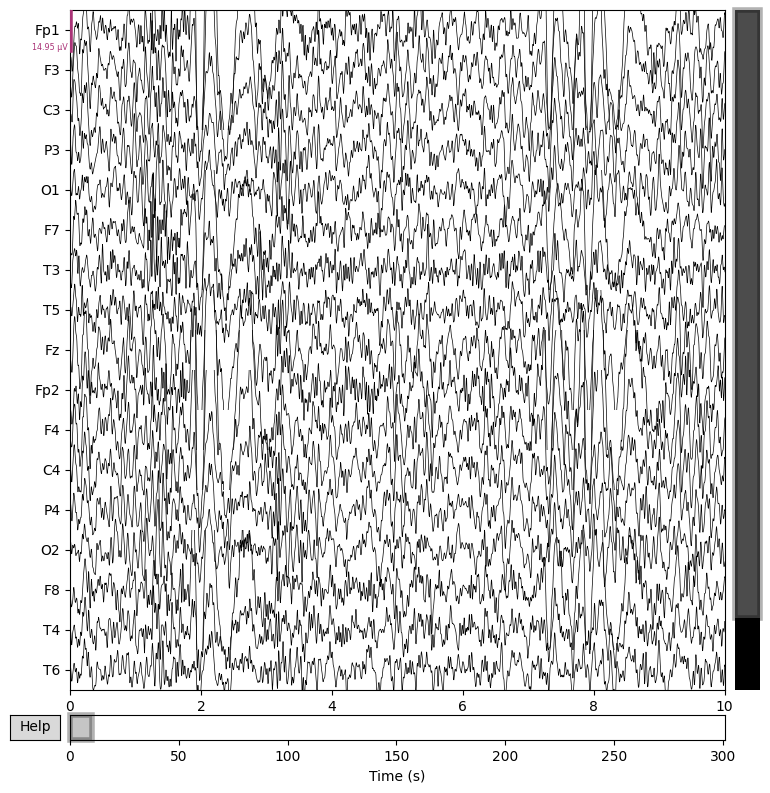

Effective window size : 8.000 (s)


/var/folders/c6/ml47p_317kjcw90pxjg9s7sc0000gn/T/ipykernel_98830/96775085.py:10: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_data.plot_psd()


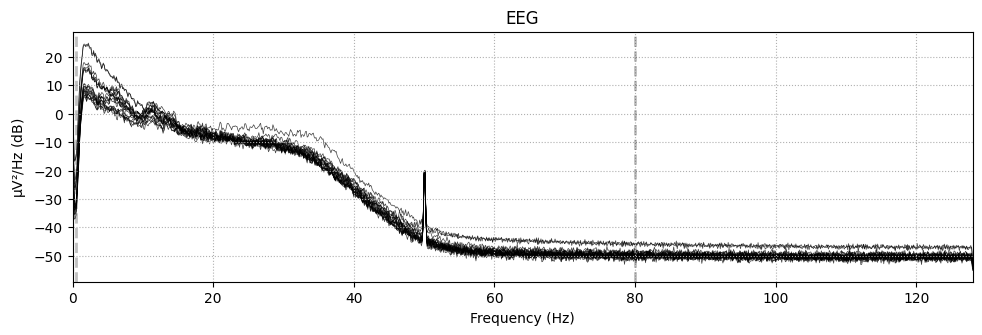

Plotting: ('/Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S9_TASK.edf',)
Opening raw-browser...


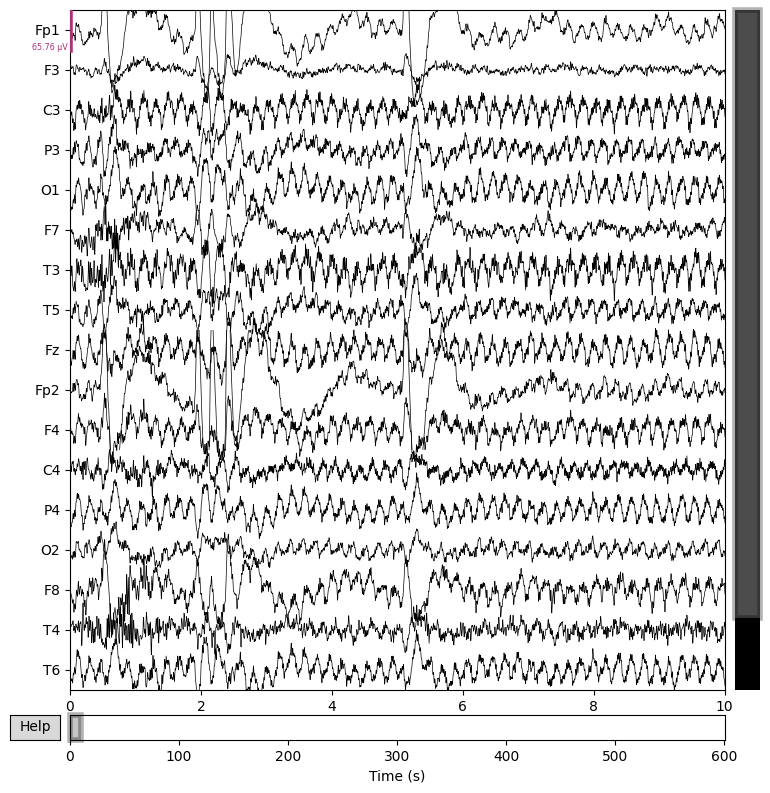

Effective window size : 8.000 (s)


/var/folders/c6/ml47p_317kjcw90pxjg9s7sc0000gn/T/ipykernel_98830/96775085.py:10: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_data.plot_psd()


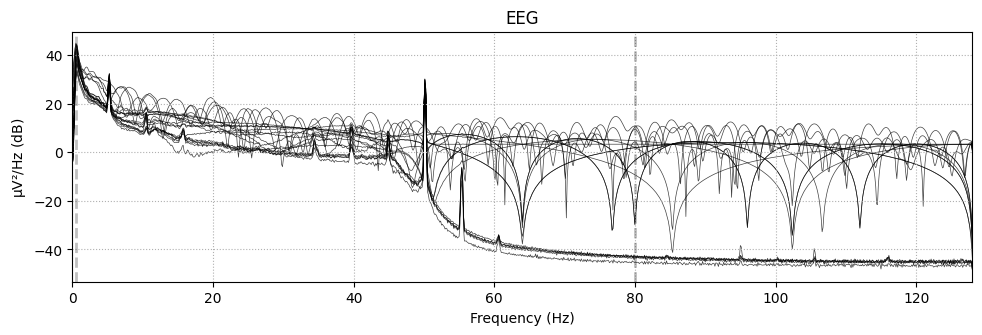

Plotting: ('/Users/hansandreanto/Development/capstone-project/edf_dataset_2/MDD_S20_TASK.edf',)
Opening raw-browser...


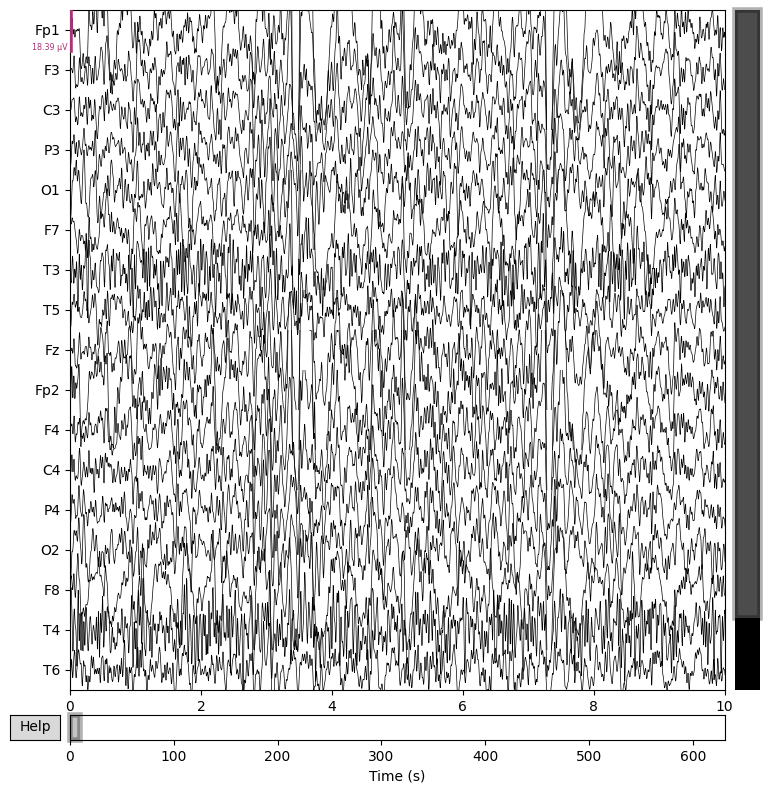

Effective window size : 8.000 (s)


/var/folders/c6/ml47p_317kjcw90pxjg9s7sc0000gn/T/ipykernel_98830/96775085.py:10: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_data.plot_psd()


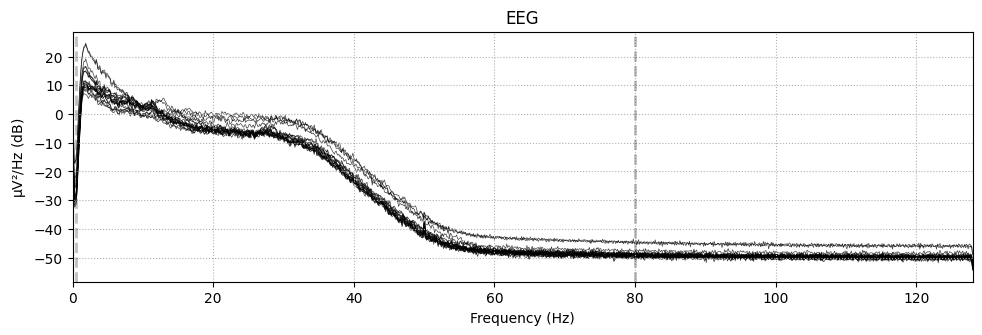

In [19]:
# Plot the raw data
plot_data(healthy_ec_data)
plot_data(mdd_ec_data)
plot_data(healthy_eo_data)
plot_data(mdd_eo_data)
plot_data(healthy_task_data)
plot_data(mdd_task_data)

Plotting: ('/Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S9_EC.edf',)
Opening raw-browser...


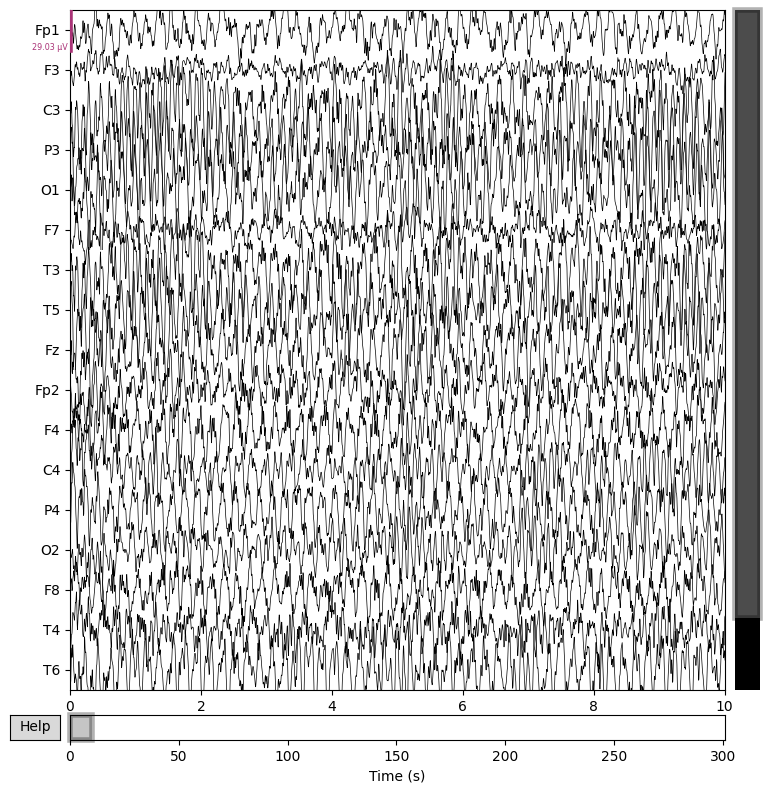

Effective window size : 8.000 (s)


/var/folders/c6/ml47p_317kjcw90pxjg9s7sc0000gn/T/ipykernel_98830/96775085.py:10: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_data.plot_psd()


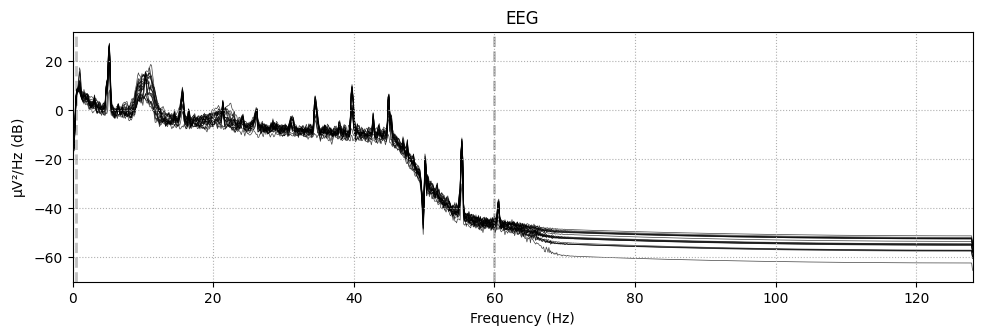

Plotting: ('/Users/hansandreanto/Development/capstone-project/edf_dataset_2/MDD_S34_EC.edf',)
Opening raw-browser...


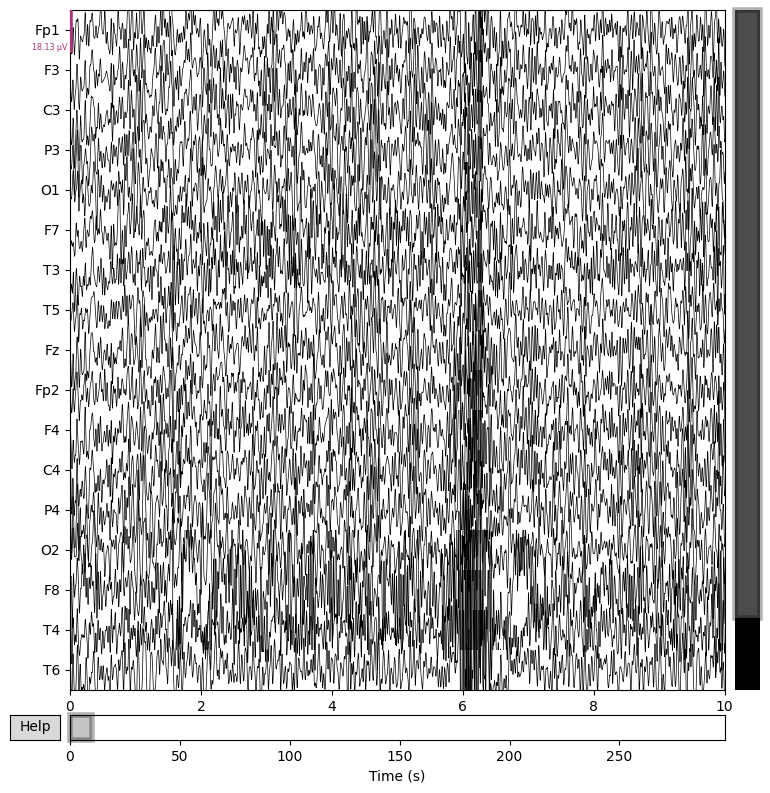

Effective window size : 8.000 (s)


/var/folders/c6/ml47p_317kjcw90pxjg9s7sc0000gn/T/ipykernel_98830/96775085.py:10: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_data.plot_psd()


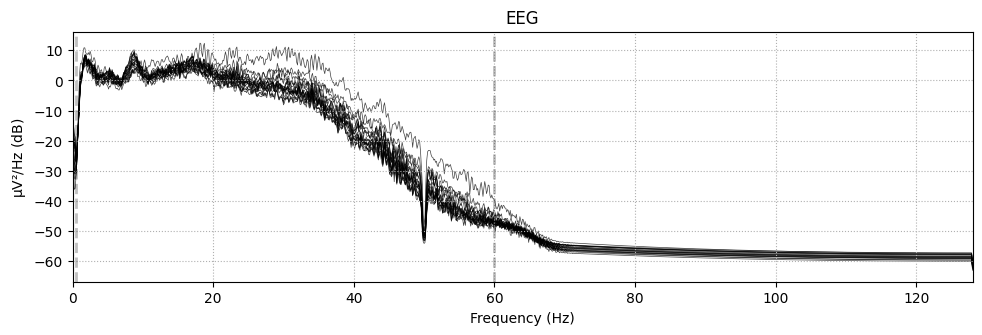

Plotting: ('/Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S27_EO.edf',)
Opening raw-browser...


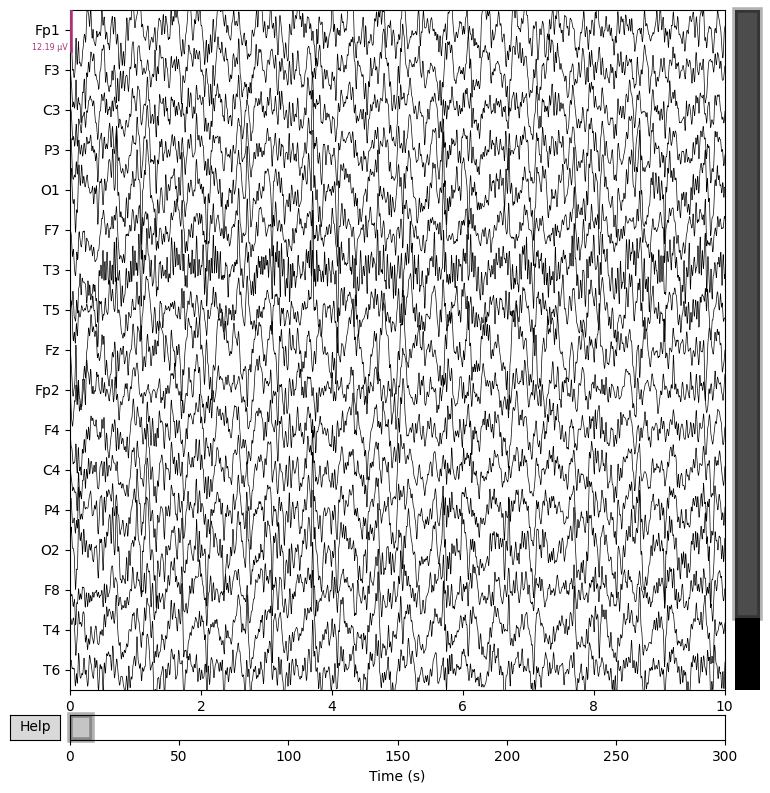

Effective window size : 8.000 (s)


/var/folders/c6/ml47p_317kjcw90pxjg9s7sc0000gn/T/ipykernel_98830/96775085.py:10: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_data.plot_psd()


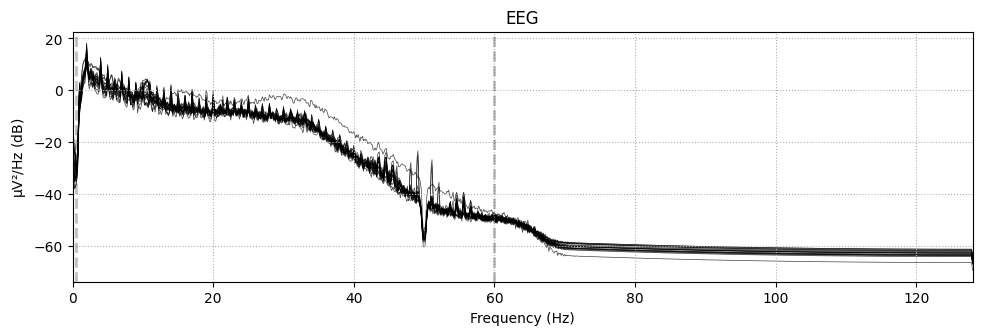

Plotting: ('/Users/hansandreanto/Development/capstone-project/edf_dataset_2/MDD_S6_EO.edf',)
Opening raw-browser...


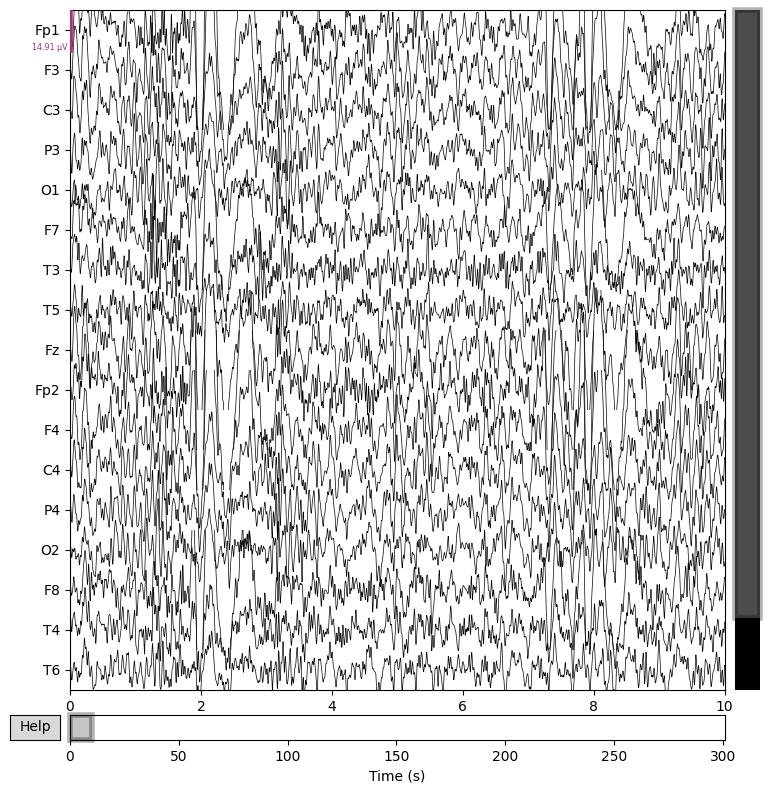

Effective window size : 8.000 (s)


/var/folders/c6/ml47p_317kjcw90pxjg9s7sc0000gn/T/ipykernel_98830/96775085.py:10: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_data.plot_psd()


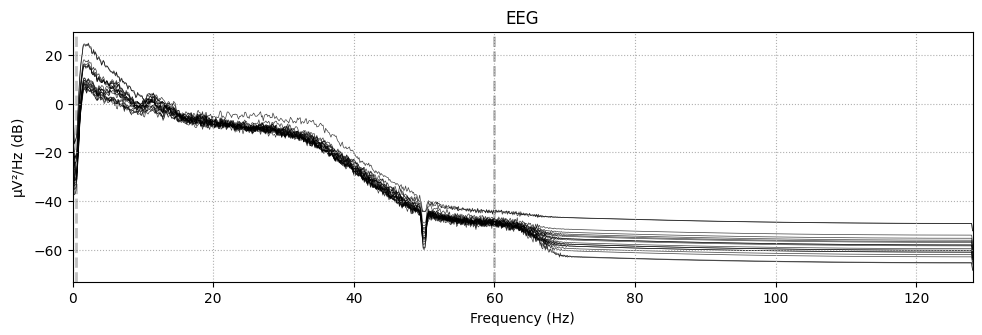

Plotting: ('/Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S9_TASK.edf',)
Opening raw-browser...


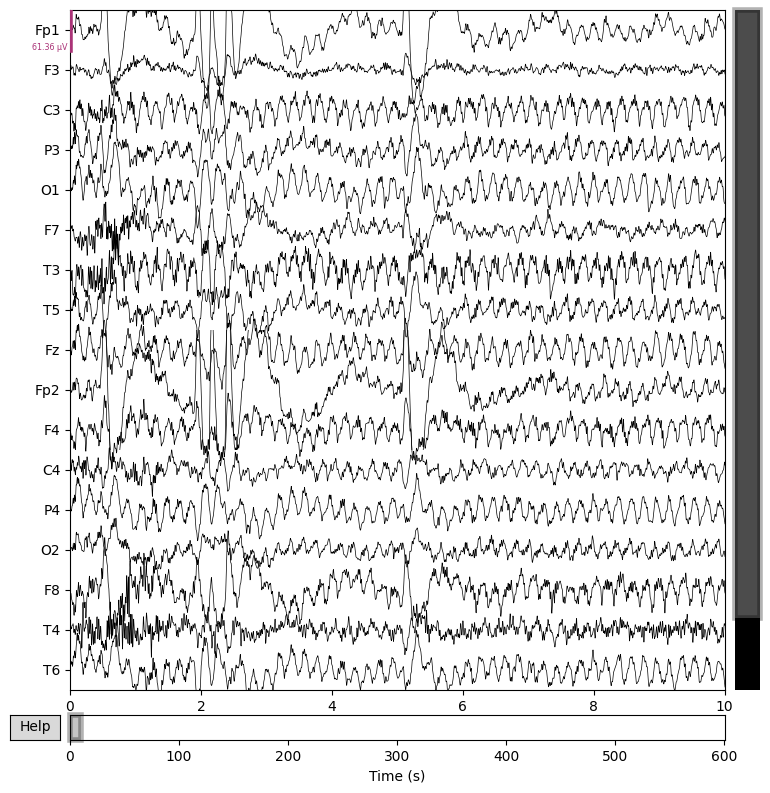

Effective window size : 8.000 (s)


/var/folders/c6/ml47p_317kjcw90pxjg9s7sc0000gn/T/ipykernel_98830/96775085.py:10: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_data.plot_psd()


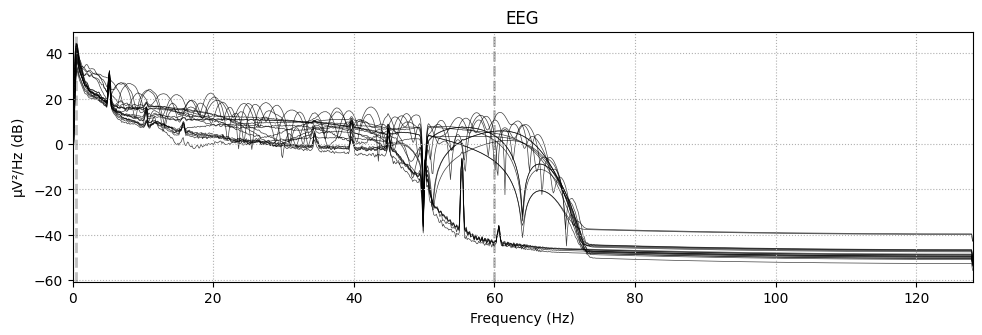

Plotting: ('/Users/hansandreanto/Development/capstone-project/edf_dataset_2/MDD_S20_TASK.edf',)
Opening raw-browser...


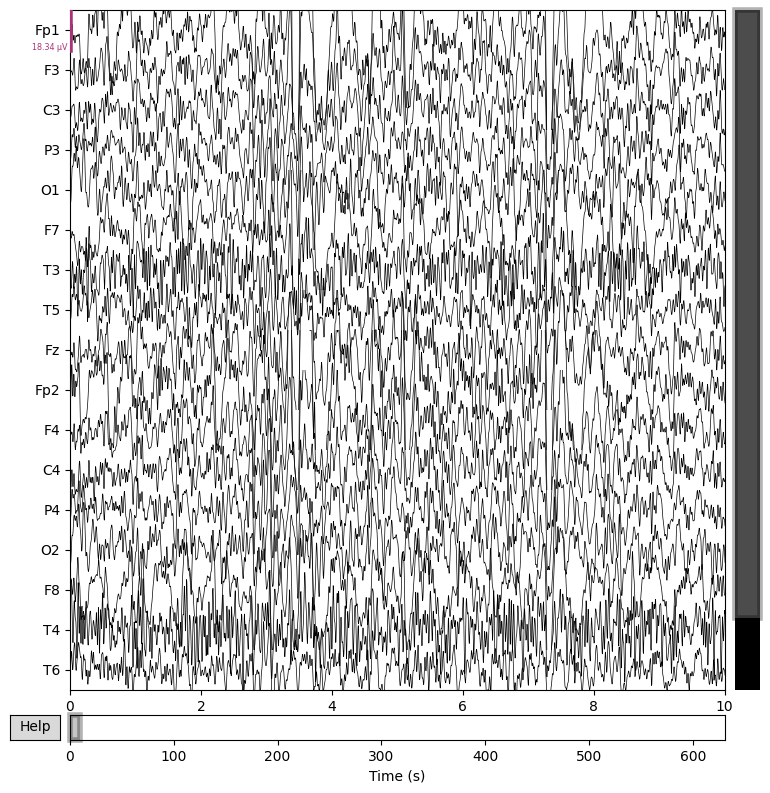

Effective window size : 8.000 (s)


/var/folders/c6/ml47p_317kjcw90pxjg9s7sc0000gn/T/ipykernel_98830/96775085.py:10: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  raw_data.plot_psd()


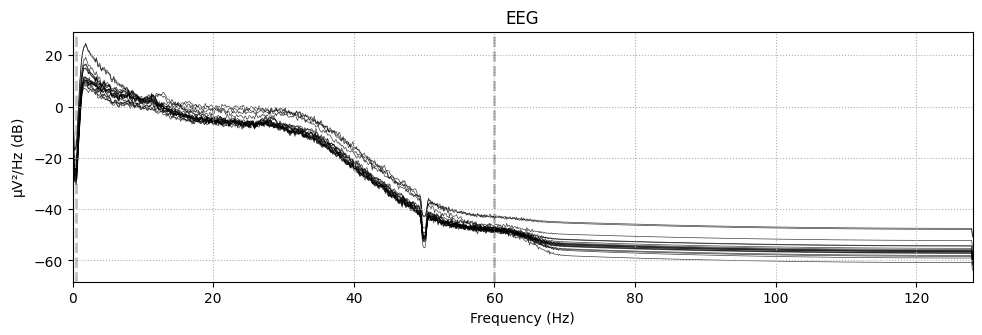

In [32]:
# Plot the raw data
plot_data(filtered_healthy_ec)
plot_data(filtered_mdd_ec)
plot_data(filtered_healthy_eo)
plot_data(filtered_mdd_eo)
plot_data(filtered_healthy_task)
plot_data(filtered_mdd_task)

# Preprocessing Data

In [5]:
# Function to rename channels and drop specified channels based on conditions
def process_channels(raw_data):
    """
    Process and standardize EEG channels to keep only the 17 most common channels.
    """
    print(f"Initial channels: {raw_data.ch_names}")

    # Initialize a list to hold channels to drop
    channels_to_drop = []

    # Create mapping for channel renaming
    rename_map = {}
    for name in raw_data.ch_names:
        if any(x in name for x in ['23A-23R', '24A-24R', 'A2-A1']):
            channels_to_drop.append(name)
        else:
            new_name = name.replace('EEG ', '').replace('-LE', '')
            rename_map[name] = new_name

    # Drop unwanted channels
    if channels_to_drop:
        print(f"Dropping channels: {channels_to_drop}")
        raw_data.drop_channels(channels_to_drop)

    # Rename remaining channels
    raw_data.rename_channels(rename_map)

    print(f"Final channels: {raw_data.ch_names}")

    # Define the 17 most common channels
    expected_channels = [
        'Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'Fp2',
        'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz'
    ]

    # Keep only the expected channels
    channels_to_keep = set(expected_channels)
    channels_to_drop = [
        ch for ch in raw_data.ch_names if ch not in channels_to_keep]

    if channels_to_drop:
        print(
            f"Dropping channels to keep only the expected 17 channels: {channels_to_drop}")
        raw_data.drop_channels(channels_to_drop)

    # Verify we have the expected number of channels (should be 17)
    if len(raw_data.ch_names) != len(expected_channels):
        print(
            f"Warning: Expected {len(expected_channels)} channels, got {len(raw_data.ch_names)}")
        print(f"Missing: {set(expected_channels) - set(raw_data.ch_names)}")

    return raw_data

In [6]:
all_edf_files = os.listdir(edf_directory)
ec_file_path = [i for i in all_edf_files if i.endswith('EC.edf')]
eo_file_path = [i for i in all_edf_files if i.endswith('EO.edf')]
task_file_path = [i for i in all_edf_files if i.endswith('TASK.edf')]

print(len(all_edf_files), len(ec_file_path),
      len(eo_file_path), len(task_file_path))

180 58 61 61


In [7]:
def read_data(file_path):
    data = mne.io.read_raw_edf(file_path, preload=True)
    data.set_eeg_reference()
    return data

In [8]:
def bandpass_filter(data, l_freq, h_freq, notch_freq=None):
    filtered_data = data.copy()

    # Apply bandpass first
    filtered_data.filter(l_freq=l_freq, h_freq=h_freq,
                         method='fir', phase='zero')

    # If using notch, apply with wider bandwidth
    if notch_freq is not None:
        filtered_data.notch_filter(freqs=notch_freq, notch_widths=2.0)

    return filtered_data

# Preprocessing

In [9]:
all_edf_files = os.listdir(edf_directory)
ec_file_path = [i for i in all_edf_files if i.endswith('EC.edf')]
eo_file_path = [i for i in all_edf_files if i.endswith('EO.edf')]
task_file_path = [i for i in all_edf_files if i.endswith('TASK.edf')]

print(len(all_edf_files), len(ec_file_path),
      len(eo_file_path), len(task_file_path))

180 58 61 61


In [10]:
def read_data(file_path):
    data = mne.io.read_raw_edf(file_path, preload=True)
    data.set_eeg_reference()
    return data

In [11]:
def bandpass_filter(data, l_freq, h_freq, notch_freq=None):
    filtered_data = data.copy()

    # Apply bandpass first
    filtered_data.filter(l_freq=l_freq, h_freq=h_freq,
                         method='fir', phase='zero')

    # If using notch, apply with wider bandwidth
    if notch_freq is not None:
        filtered_data.notch_filter(freqs=notch_freq, notch_widths=2.0)

    return filtered_data

In [12]:
ica_channels = ['Fp1', 'Fp2']

In [13]:
def preprocess_ICA(epochs, n_components):
    """
    Apply Independent Component Analysis (ICA) to the epochs data.
    
    Parameters:
    -----------
    epochs : mne.Epochs
        The epochs data to process.
    n_components : int
        The number of components to extract.
    
    Returns:
    --------
    ica : ICA
        The fitted ICA object.
    """
    print(
        f"Preprocessing ICA for {len(epochs)} epochs...")  # Print the number of epochs being processed

    ica = ICA(n_components=n_components, random_state=97, max_iter=800)
    # Use the epochs directly
    ica.fit(epochs.copy().pick_channels(ica_channels))
    return ica

In [14]:
def create_epochs(processed_data, duration=5.0, overlap=1.0):
    """
    Create epochs from continuous EEG data and format for CNN input
    
    Parameters:
    -----------
    processed_data : mne.io.Raw
        The raw EEG data
    duration : float
        Duration of each epoch in seconds
    overlap : float
        Overlap between epochs in seconds
    
    Returns:
    --------
    epochs_array : numpy.ndarray
        The epoched data formatted for CNN (samples, channels, timepoints, 1)
    """

    # Create epochs
    epochs = mne.make_fixed_length_epochs(
        processed_data,
        duration=duration,
        overlap=overlap,
        preload=True
    )

    # Drop bad epochs
    epochs.drop_bad()

    # Get data and reshape for CNN
    # Shape will be (n_epochs, n_channels, n_timepoints)
    data = epochs.get_data()

    # Add channel dimension for CNN: (n_epochs, n_channels, n_timepoints, 1)
    data = data[..., np.newaxis]

    return data

In [15]:
# Directory containing the EDF files
edf_directory = "./edf_dataset_2"  # Adjust this path to your dataset location

# Initialize lists
processed_raw_data = []
class_counts = {'Healthy': 0, 'MDD': 0}

# Read all EDF files
for filename in os.listdir(edf_directory):
    if filename.endswith('.edf'):
        file_path = os.path.join(edf_directory, filename)
        try:
            # Read the raw data
            raw_data = read_data(file_path)

            if raw_data is not None:
                processed_raw_data.append(raw_data)
                print(f"Successfully loaded: {filename}")
            else:
                print(f"Failed to load: {filename}")

        except Exception as e:
            print(f"Error loading {filename}: {str(e)}")
            continue

print(f"\nTotal files loaded: {len(processed_raw_data)}")

Extracting EDF parameters from /Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S4_TASK.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 154879  =      0.000 ...   604.996 secs...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Successfully loaded: H_S4_TASK.edf
Extracting EDF parameters from /Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S5_TASK.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 156671  =      0.000 ...   611.996 secs...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Successfully loaded: H_S5_TASK.edf
Extracting EDF parameters from /Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S16_EO.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 

In [16]:
def preprocess_eeg(raw_data, l_freq=0.5, h_freq=60.0, notch_freq=50.0, n_components=2, epoch_duration=5.0, epoch_overlap=1.0):
    """
    Complete EEG preprocessing pipeline: filter -> bad channel removal -> epoching -> ICA -> baseline correction
    """
    try:
        # print(f"\nProcessing file: {filename}")

        # Make a copy of the raw data to prevent modifications to original
        processed_raw = raw_data.copy()

        # 1. Bandpass filtering
        print("1. Applying bandpass filter...")
        try:
            bandpass_filter(processed_raw, l_freq, h_freq, notch_freq)
            print("Bandpass filtering completed")
        except Exception as e:
            print(f"Error during bandpass filtering: {str(e)}")
            return None

        # 2. Bad channel removal
        print("2. Removing bad channels...")
        try:
            processed_raw = process_channels(raw_data=processed_raw)
            print("Bad channels removed")
        except Exception as e:
            print(f"Error during bad channel removal: {str(e)}")
            return None

        # 3. Epoching
        print("3. Creating epochs...")
        try:
            epochs = mne.make_fixed_length_epochs(
                processed_raw,
                duration=epoch_duration,
                overlap=epoch_overlap,
                preload=True
            )

            # Drop bad epochs
            epochs.drop_bad()

            # Get data and reshape for CNN
            data = epochs.get_data()
            data = data[..., np.newaxis]  # Add channel dimension for CNN

            print(f"Epoching completed. Final data shape: {data.shape}")
        except Exception as e:
            print(f"Error during epoching: {str(e)}")
            return None

        # 4. ICA
        print("4. Applying ICA...")
        try:
            # Pass the epochs object
            ica = preprocess_ICA(epochs, n_components)
            ica.apply(epochs)  # Apply ICA to the epochs
            print("ICA completed")
        except Exception as e:
            print(f"Error during ICA: {str(e)}")
            return None

        # 5. Baseline correction
        print("5. Applying baseline correction...")
        try:
            # Apply baseline correction over the entire epoch
            epochs.apply_baseline((None, None))
            print("Baseline correction completed")
        except Exception as e:
            print(f"Error during baseline correction: {str(e)}")
            return None

        return data  # Return the processed data

    except Exception as e:
        print(f"General preprocessing error: {str(e)}")
        return None

In [17]:

# Now process each raw data file
X_data = []
y_labels = []
class_counts = {'Healthy': 0, 'MDD': 0}

print("\nStarting preprocessing pipeline...")
for raw_data in processed_raw_data:
    # Get the filename from the raw data
    filename = os.path.basename(raw_data.filenames[0])
    print(f"\n{'='*50}")
    print(f"Processing: {filename}")
    print(f"Initial data info:")
    print(f"Channels: {raw_data.ch_names}")
    print(f"Sample rate: {raw_data.info['sfreq']} Hz")
    print(f"Duration: {raw_data.n_times / raw_data.info['sfreq']:.2f} seconds")

    # Apply complete preprocessing pipeline
    try:
        # Apply complete preprocessing pipeline
        processed_data = preprocess_eeg(
            raw_data,

            l_freq=0.5,
            h_freq=50.0,
            n_components=2,
            notch_freq=50.0,
            epoch_duration=5.0,
            epoch_overlap=1.0
        )

        if processed_data is not None:
            print(f"Processed data shape: {processed_data.shape}")

            # Create label (1 for MDD, 0 for Healthy)
            label = 1 if filename.startswith('MDD') else 0

            # Update counts with number of epochs
            if label == 1:
                class_counts['MDD'] += processed_data.shape[0]
            else:
                class_counts['Healthy'] += processed_data.shape[0]

            # Append to lists
            X_data.append(processed_data)
            y_labels.extend([label] * processed_data.shape[0])
            print(f"Successfully processed {filename}")
        else:
            print(f"Failed to process {filename}")

    except Exception as e:
        print(f"Error processing {filename}: {str(e)}")
        continue

    print(f"{'='*50}\n")


Starting preprocessing pipeline...

Processing: H_S4_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter lengt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1691 samples (6.605 sec)

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1'

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:312: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  this_h = firwin(this_N, (prev_freq + this_freq) / 2.,
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:312: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  this_h = firwin(this_N, (prev_freq + this_freq) / 2.,
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capsto

Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (151, 17, 1280, 1)
Successfully processed H_S4_TASK.edf


Processing: H_S5_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 612.00 seconds
1.

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (152, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 152 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (152, 17, 1280, 1)
Successfully processed H_S5_TASK.edf


Processing: H_S16_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S16_EO.edf


Processing: MDD_S17_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 297.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S17_EC.edf


Processing: H_S13_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S13_EC.edf


Processing: MDD_S12_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 189.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1691 samples (6.605 sec)

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1'

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1772: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (159, 17, 1280, 1)
Successfully processed MDD_S26_TASK.edf


Processing: MDD_S27_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 610.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 152 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (152, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 152 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (152, 17, 1280, 1)
Successfully processed MDD_S27_TASK.edf


Processing: H_S25_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S25_EC.edf


Processing: MDD_S24_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S24_EO.edf


Processing: MDD_S33_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 298.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filte

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S33_EC.edf


Processing: H_S20_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 320.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (79, 17, 1280, 1)
Successfully processed H_S20_EO.edf


Processing: MDD_S18_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 636.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
-

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S29_EC.edf


Processing: MDD_S19_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 636.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-ph

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S21_EC.edf


Processing: MDD_S28_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S28_EO.edf


Processing: H_S6_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 303.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S6_EO.edf


Processing: MDD_S12_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 649.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
162 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 162 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (162, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 162 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (157, 17, 1280, 1)
Successfully processed MDD_S13_TASK.edf


Processing: MDD_S7_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Apply

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S7_EC.edf


Processing: MDD_S2_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 297.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S2_EO.edf


Processing: H_S3_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Win

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S3_EC.edf


Processing: MDD_S31_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 633.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (157, 17, 1280, 1)
Successfully processed MDD_S30_TASK.edf


Processing: H_S29_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Du

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (151, 17, 1280, 1)
Successfully processed H_S28_TASK.edf


Processing: MDD_S1_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Dur

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.4s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S1_EC.edf


Processing: H_S8_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, n

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
75 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 75 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (75, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 75 epochs...
Fitting 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.4s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S9_EC.edf


Processing: H_S17_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1691 samples (6.605 sec)

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4'

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1772: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('- Lower passband edge: %0.2f' % (l_freq,))
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1773: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' (%s cutoff frequency: %0.2f Hz)' % (
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1799: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (158, 17, 1280, 1)
Successfully processed H_S16_TASK.edf


Processing: MDD_S5_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
-

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S5_EC.edf


Processing: H_S4_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 295.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Win

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1691 samples (6.605 sec)

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1772: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('- Lower passband edge: %0.2f' % (l_freq,))
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1773: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' (%s cutoff frequency: %0.2f Hz)' % (
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1799: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure

Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (73, 17, 1280, 1)
Successfully processed H_S4_EO.edf


Processing: H_S11_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper p

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S11_EC.edf


Processing: H_S18_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase,

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bad channels removed
3. Creating epochs...
Not setting metadata
75 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 75 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (75, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 75 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S18_EO.edf


Processing: MDD_S10_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (74, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 74 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S10_EO.edf


Processing: MDD_S19_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S19_EC.edf


Processing: H_S23_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 620.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
-

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
154 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 154 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (154, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 154 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 150 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (150, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 150 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

- Filter length: 1691 samples (6.605 sec)

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Dropping channels: ['EEG A2-A1']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 74 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (74, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 74 epochs...
Fitting ICA to data using

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1822: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  float(min(h_check, l_check)),)
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:312: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  this_h = firwin(this_N, (prev_freq + this_freq) / 2.,
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:312: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  this_h = firwin(this_N, (prev_freq + this_freq) / 2.,


Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S15_EC.edf


Processing: H_S22_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S22_EO.edf


Processing: MDD_S23_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 303.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S23_EC.edf


Processing: MDD_S34_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 296.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (73, 17, 1280, 1)
Successfully processed MDD_S34_EO.edf


Processing: H_S30_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S30_EO.edf


Processing: MDD_S31_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S31_EC.edf


Processing: H_S27_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S27_EC.edf


Processing: MDD_S26_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S26_EO.edf


Processing: MDD_S1_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 303.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (f

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S1_EC.edf


Processing: H_S9_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase,

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S9_EC.edf


Processing: MDD_S6_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 639.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
159 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 159 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (159, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 159 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S5_EC.edf


Processing: MDD_S4_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firw

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi


Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Dropping channels: ['EEG A2-A1']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
75 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 75 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (75, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 75 epochs...
Fitting ICA to data using 2 channels (please be patient, this may t

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:312: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  this_h = firwin(this_N, (prev_freq + this_freq) / 2.,
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:312: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  this_h = firwin(this_N, (prev_freq + this_freq) / 2.,


Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S4_EO.edf


Processing: H_S10_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (151, 17, 1280, 1)
Successfully processed H_S10_TASK.edf


Processing: H_S11_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds


/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S22_EO.edf


Processing: H_S23_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S23_EC.edf


Processing: MDD_S27_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S27_EC.edf


Processing: H_S26_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 305.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (76, 17, 1280, 1)
Successfully processed H_S26_EO.edf


Processing: H_S24_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 644.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (160, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 160 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (160, 17, 1280, 1)
Successfully processed H_S24_TASK.edf


Processing: H_S25_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 643.00 seconds


/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 160 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (160, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 160 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S30_EO.edf


Processing: MDD_S11_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S11_EC.edf


Processing: MDD_S18_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S18_EO.edf


Processing: H_S10_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S10_EO.edf


Processing: H_S19_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Win

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S19_EC.edf


Processing: MDD_S14_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S14_EO.edf


Processing: H_S15_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S15_EC.edf


Processing: MDD_S32_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S32_EO.edf


Processing: MDD_S25_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S25_EC.edf


Processing: H_S24_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 297.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S24_EO.edf


Processing: H_S3_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Wi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (151, 17, 1280, 1)
Successfully processed H_S3_TASK.edf


Processing: H_S2_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-pha

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (151, 17, 1280, 1)
Successfully processed H_S2_TASK.edf


Processing: MDD_S20_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filte

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S20_EO.edf


Processing: MDD_S29_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.4s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S29_EC.edf


Processing: MDD_S21_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 632.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (157, 17, 1280, 1)
Successfully processed MDD_S21_TASK.edf


Processing: MDD_S20_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz


/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (157, 17, 1280, 1)
Successfully processed MDD_S20_TASK.edf


Processing: H_S21_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Dura

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S21_EC.edf


Processing: H_S28_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Win

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S28_EO.edf


Processing: MDD_S16_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 298.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S16_EO.edf


Processing: H_S17_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 309.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (77, 17, 1280, 1)
Successfully processed H_S17_EC.edf


Processing: MDD_S13_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S13_EC.edf


Processing: H_S12_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S12_EO.edf


Processing: MDD_S6_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fir

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S6_EO.edf


Processing: H_S7_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 356.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Win

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (88, 17, 1280, 1)
Successfully processed H_S7_EC.edf


Processing: H_S9_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 601.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase,

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (150, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 150 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (150, 17, 1280, 1)
Successfully processed H_S9_TASK.edf


Processing: H_S8_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 609.00 seconds
1.

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (152, 17, 1280, 1)
Successfully processed H_S8_TASK.edf


Processing: H_S2_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fir

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S2_EO.edf


Processing: MDD_S3_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 180.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firw

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1691 samples (6.605 sec)

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1'

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1772: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (156, 17, 1280, 1)
Successfully processed MDD_S15_TASK.edf


Processing: MDD_S14_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 635.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (158, 17, 1280, 1)
Successfully processed MDD_S14_TASK.edf


Processing: MDD_S8_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S6_EC.edf


Processing: H_S7_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 303.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Win

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S7_EO.edf


Processing: H_S2_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S2_EC.edf


Processing: MDD_S3_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firw

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S3_EO.edf


Processing: MDD_S32_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S32_EC.edf


Processing: MDD_S32_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 628.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
156 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 156 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (156, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 156 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (164, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 164 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (164, 17, 1280, 1)
Successfully processed MDD_S33_TASK.edf


Processing: MDD_S25_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Du

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S25_EO.edf


Processing: H_S24_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S24_EC.edf


Processing: MDD_S20_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S20_EC.edf


Processing: MDD_S29_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filte

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (74, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 74 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S29_EO.edf


Processing: H_S21_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 305.00 seconds
1. Ap

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (76, 17, 1280, 1)
Successfully processed H_S21_EO.edf


Processing: H_S28_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Win

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S28_EC.edf


Processing: MDD_S2_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 644.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

160 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 160 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (160, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 160 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (160, 17, 1280, 1)
Successfully processed MDD_S2_TASK.edf


Processing: MDD_S3_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S17_EO.edf


Processing: H_S14_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 607.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (151, 17, 1280, 1)
Successfully processed H_S14_TASK.edf


Processing: H_S15_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 610.00 seconds


/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (152, 17, 1280, 1)
Successfully processed H_S15_TASK.edf


Processing: MDD_S13_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 311.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (77, 17, 1280, 1)
Successfully processed MDD_S13_EO.edf


Processing: MDD_S22_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 297.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S22_EC.edf


Processing: H_S23_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S23_EO.edf


Processing: MDD_S27_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S27_EO.edf


Processing: H_S26_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S26_EC.edf


Processing: MDD_S30_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 241.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (60, 17, 1280, 1)
Successfully processed MDD_S30_EC.edf


Processing: MDD_S11_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filte

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S11_EO.edf


Processing: MDD_S18_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S18_EC.edf


Processing: MDD_S11_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 637.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (159, 17, 1280, 1)
Successfully processed MDD_S11_TASK.edf


Processing: MDD_S10_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 686.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, ze

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
171 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 171 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (171, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 171 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (93, 17, 1280, 1)
Successfully processed H_S10_EC.edf


Processing: H_S19_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Win

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S19_EO.edf


Processing: MDD_S14_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S14_EC.edf


Processing: H_S15_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S15_EO.edf


Processing: H_S7_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Wi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (151, 17, 1280, 1)
Successfully processed H_S7_TASK.edf


Processing: H_S6_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 611.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-pha

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (152, 17, 1280, 1)
Successfully processed H_S6_TASK.edf


Processing: MDD_S1_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S1_EO.edf


Processing: H_S9_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Win

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S9_EO.edf


Processing: H_S5_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 312.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windo

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (77, 17, 1280, 1)
Successfully processed H_S5_EO.edf


Processing: MDD_S25_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 628.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-pha

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
156 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 156 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (156, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 156 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (158, 17, 1280, 1)
Successfully processed MDD_S24_TASK.edf


Processing: H_S30_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 633.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (158, 17, 1280, 1)
Successfully processed H_S30_TASK.edf


Processing: H_S11_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1.

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S11_EO.edf


Processing: MDD_S28_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 632.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
-

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S10_EC.edf


Processing: MDD_S29_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 631.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S19_EO.edf


Processing: H_S14_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S14_EC.edf


Processing: MDD_S15_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S15_EO.edf


Processing: H_S22_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S22_EC.edf


Processing: MDD_S23_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 307.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (76, 17, 1280, 1)
Successfully processed MDD_S23_EO.edf


Processing: MDD_S16_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 638.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (159, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 159 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (159, 17, 1280, 1)
Successfully processed MDD_S16_TASK.edf


Processing: MDD_S17_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz


/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S34_EC.edf


Processing: H_S30_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S30_EC.edf


Processing: MDD_S31_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S31_EO.edf


Processing: H_S27_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed H_S27_EO.edf


Processing: MDD_S26_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S26_EC.edf


Processing: H_S1_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (151, 17, 1280, 1)
Successfully processed H_S1_TASK.edf


Processing: MDD_S22_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 641.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (160, 17, 1280, 1)
Successfully processed MDD_S22_TASK.edf


Processing: MDD_S23_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 632.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, ze

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (87, 17, 1280, 1)
Successfully processed H_S1_EO.edf


Processing: H_S8_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windo

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S8_EC.edf


Processing: MDD_S9_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firw

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S9_EO.edf


Processing: MDD_S5_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S5_EO.edf


Processing: H_S4_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Win

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S4_EC.edf


Processing: H_S27_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 633.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Wi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (152, 17, 1280, 1)
Successfully processed H_S26_TASK.edf


Processing: H_S6_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S6_EC.edf


Processing: MDD_S2_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 297.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firw

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S2_EC.edf


Processing: H_S19_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 608.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (76, 17, 1280, 1)
Successfully processed H_S3_EO.edf


Processing: H_S18_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 608.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Wi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (151, 17, 1280, 1)
Successfully processed H_S18_TASK.edf


Processing: H_S16_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 292.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (72, 17, 1280, 1)
Successfully processed H_S16_EC.edf


Processing: MDD_S34_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 658.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
-

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
164 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 164 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (164, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 164 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S17_EO.edf


Processing: H_S13_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 303.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S13_EO.edf


Processing: MDD_S5_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 614.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (153, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 153 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (153, 17, 1280, 1)
Successfully processed MDD_S5_TASK.edf


Processing: MDD_S4_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Du

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S24_EC.edf


Processing: H_S13_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 610.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-ph

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (152, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 152 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (152, 17, 1280, 1)
Successfully processed H_S13_TASK.edf


Processing: H_S12_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds


/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (151, 17, 1280, 1)
Successfully processed H_S12_TASK.edf


Processing: MDD_S33_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 296.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (73, 17, 1280, 1)
Successfully processed MDD_S33_EO.edf


Processing: H_S20_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 307.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- W

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (76, 17, 1280, 1)
Successfully processed H_S20_EC.edf


Processing: H_S29_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase,

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed H_S29_EO.edf


Processing: MDD_S21_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (fi

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (74, 17, 1280, 1)
Successfully processed MDD_S21_EO.edf


Processing: MDD_S28_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filte

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed
Processed data shape: (75, 17, 1280, 1)
Successfully processed MDD_S28_EC.edf



In [18]:
# Print final summary
print("\nProcessing Summary:")
print(f"Total files processed: {len(processed_raw_data)}")
print(f"Total epochs: {len(y_labels)}")
print(f"Successfully processed files: {len(X_data)}")
print(f"Failed files: {len(processed_raw_data) - len(X_data)}")
print("\nClass distribution:")
print(f"MDD epochs: {class_counts['MDD']}")
print(f"Healthy epochs: {class_counts['Healthy']}")


Processing Summary:
Total files processed: 180
Total epochs: 18312
Successfully processed files: 180
Failed files: 0

Class distribution:
MDD epochs: 9756
Healthy epochs: 8556


In [19]:
# Check if we have any processed data
if len(X_data) > 0:
    try:
        # Print shapes before concatenation
        print("\nArray shapes before concatenation:")
        for i, arr in enumerate(X_data):
            print(f"Array {i}: shape {arr.shape}")

        # Concatenate data
        X = np.concatenate(X_data, axis=0)
        y = np.array(y_labels)

        # Print final information
        print("\nFinal Dataset Information:")
        print(f"Total samples: {len(X)}")
        print(f"Healthy samples: {class_counts['Healthy']}")
        print(f"MDD samples: {class_counts['MDD']}")
        print(f"Input shape: {X.shape}")
        print(f"Labels shape: {y.shape}")

        # Print channel information
        print(f"\nChannels used: {raw_data.ch_names}")

        # Print class balance
        total_epochs = class_counts['MDD'] + class_counts['Healthy']
        print("\nClass balance:")
        print(f"MDD: {(class_counts['MDD']/total_epochs)*100:.2f}%")
        print(f"Healthy: {(class_counts['Healthy']/total_epochs)*100:.2f}%")

    except Exception as e:
        print(f"\nError during final processing: {str(e)}")
        print("Checking individual arrays for inconsistencies...")

        # Find arrays with different shapes
        base_shape = X_data[0].shape[1:]
        for i, arr in enumerate(X_data):
            if arr.shape[1:] != base_shape:
                print(
                    f"Mismatch at index {i}: expected {base_shape}, got {arr.shape[1:]}")
else:
    print("\nNo data was successfully processed!")


Array shapes before concatenation:
Array 0: shape (151, 17, 1280, 1)
Array 1: shape (152, 17, 1280, 1)
Array 2: shape (74, 17, 1280, 1)
Array 3: shape (74, 17, 1280, 1)
Array 4: shape (74, 17, 1280, 1)
Array 5: shape (47, 17, 1280, 1)
Array 6: shape (159, 17, 1280, 1)
Array 7: shape (152, 17, 1280, 1)
Array 8: shape (75, 17, 1280, 1)
Array 9: shape (74, 17, 1280, 1)
Array 10: shape (74, 17, 1280, 1)
Array 11: shape (79, 17, 1280, 1)
Array 12: shape (158, 17, 1280, 1)
Array 13: shape (75, 17, 1280, 1)
Array 14: shape (158, 17, 1280, 1)
Array 15: shape (74, 17, 1280, 1)
Array 16: shape (75, 17, 1280, 1)
Array 17: shape (75, 17, 1280, 1)
Array 18: shape (162, 17, 1280, 1)
Array 19: shape (157, 17, 1280, 1)
Array 20: shape (74, 17, 1280, 1)
Array 21: shape (74, 17, 1280, 1)
Array 22: shape (75, 17, 1280, 1)
Array 23: shape (158, 17, 1280, 1)
Array 24: shape (157, 17, 1280, 1)
Array 25: shape (151, 17, 1280, 1)
Array 26: shape (151, 17, 1280, 1)
Array 27: shape (157, 17, 1280, 1)
Array 28:

# 1D CNN Modelling

In [28]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.model_selection import train_test_split

In [34]:
# Print original shape
print("Original shape:", X.shape)  # Should be (18312, 19, 1280, 1)

learning_rate = 0.001
# Remove the extra dimension
# X = X.squeeze(-1)  # Shape becomes (18312, 19, 1280)
print("Reshaped data shape:", X.shape)

# Convert labels to numpy array
y = np.array(y_labels)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

Original shape: (18312, 17, 1280)
Reshaped data shape: (18312, 17, 1280)


In [46]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, GlobalAveragePooling1D, Flatten, Dense, Dropout, BatchNormalization, AveragePooling1D

# Define the CNN model
model = Sequential([
    # Input layer - Conv1D
    Conv1D(
        filters=32,
        kernel_size=11,
        activation='relu',
        padding='same',  # Add padding to prevent size issues
        input_shape=(17, 1280)
    ),

    # Second Conv1D layer
    Conv1D(
        filters=64,
        kernel_size=11,
        activation='relu',
        padding='same'  # Add padding
    ),

    # Dropout layer
    Dropout(0.2),

    # MaxPooling layer
    MaxPooling1D(pool_size=4),

    # Flatten layer
    Flatten(),

    # Dense layer
    Dense(128, activation='relu'),

    # Output layer
    Dense(1, activation='sigmoid')
])

In [47]:
# Compile the model
model.compile(
    optimizer=Adam(learning_rate=learning_rate),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Print model summary
print("\nModel Architecture:")
model.summary()


Model Architecture:
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_8 (Conv1D)           (None, 17, 32)            450592    
                                                                 
 conv1d_9 (Conv1D)           (None, 17, 64)            22592     
                                                                 
 dropout_4 (Dropout)         (None, 17, 64)            0         
                                                                 
 max_pooling1d_4 (MaxPoolin  (None, 4, 64)             0         
 g1D)                                                            
                                                                 
 flatten_4 (Flatten)         (None, 256)               0         
                                                                 
 dense_8 (Dense)             (None, 128)               32896     
                                 

In [48]:
callbacks = [
    # EarlyStopping(
    #     monitor='val_loss',
    #     patience=5,
    #     restore_best_weights=True,
    #     min_delta=0.0001
    # ),
    # ReduceLROnPlateau(
    #     monitor='val_loss',
    #     factor=0.5,
    #     patience=5,
    #     min_lr=1e-6
    # ),
    ModelCheckpoint(
        'best_model.h5',  # Use the `.keras` extension
        save_best_only=True,
        monitor='val_loss'
    )
]

In [49]:
history = model.fit(
    X, y,
    epochs=30,
    batch_size=32,
    validation_data=(X_test, y_test),
    callbacks=callbacks
)

Epoch 1/30
573/573 [==============================] - 7s 12ms/step - loss: 0.6914 - accuracy: 0.5328 - val_loss: 0.6910 - val_accuracy: 0.5329
Epoch 2/30
573/573 [==============================] - 6s 10ms/step - loss: 0.6912 - accuracy: 0.5328 - val_loss: 0.6910 - val_accuracy: 0.5329
Epoch 3/30
573/573 [==============================] - 6s 10ms/step - loss: 0.6912 - accuracy: 0.5328 - val_loss: 0.6911 - val_accuracy: 0.5329
Epoch 4/30
573/573 [==============================] - 6s 10ms/step - loss: 0.6913 - accuracy: 0.5328 - val_loss: 0.6910 - val_accuracy: 0.5329
Epoch 5/30
573/573 [==============================] - 6s 10ms/step - loss: 0.6911 - accuracy: 0.5328 - val_loss: 0.6911 - val_accuracy: 0.5329
Epoch 6/30
573/573 [==============================] - 6s 10ms/step - loss: 0.6911 - accuracy: 0.5319 - val_loss: 0.6912 - val_accuracy: 0.5329
Epoch 7/30
573/573 [==============================] - 6s 10ms/step - loss: 0.6914 - accuracy: 0.5322 - val_loss: 0.6910 - val_accuracy: 0.5329

In [50]:

# Evaluate the model
y_pred = model.predict(X_test)
y_pred_classes = (y_pred > 0.5).astype(int)
acc = accuracy_score(y_test, y_pred_classes)
f1 = f1_score(y_test, y_pred_classes)
precision = precision_score(y_test, y_pred_classes)
recall = recall_score(y_test, y_pred_classes)

print("\nModel Performance:")
print(f"Accuracy: {acc:.2f}")
print(f"F1-score: {f1:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")

115/115 [==============================] - 0s 4ms/step

Model Performance:
Accuracy: 0.85
F1-score: 0.87
Precision: 0.79
Recall: 0.98


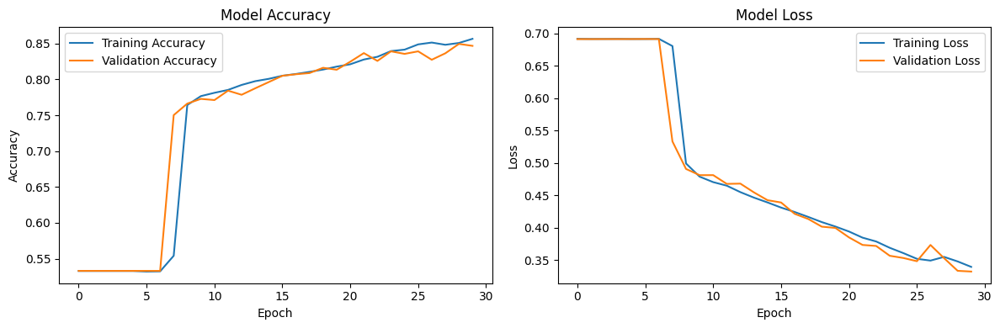

In [51]:
# Plot training history

plt.figure(figsize=(12, 4))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.legend()

plt.tight_layout()
plt.show()

In [53]:
from tensorflow.keras.models import load_model  # Save model in SavedModel format
import tensorflow as tf
MODEL_PATH = './saved_model/1d_cnn/1st_model'
tf.saved_model.save(model, MODEL_PATH)
print(f"Model saved to: {MODEL_PATH}")
# model = tf.keras.models.load_model(MODEL_PATH)

INFO:tensorflow:Assets written to: ./saved_model/1d_cnn/1st_model/assets


INFO:tensorflow:Assets written to: ./saved_model/1d_cnn/1st_model/assets


Model saved to: ./saved_model/1d_cnn/1st_model


## Experiment with Tasks

In [ ]:
# Organize files by task type and condition
task_types = {
    'EC': ec_file_path,
    'EO': eo_file_path,
    'TASK': task_file_path
}

In [3]:
import requests


def download_file(url, save_path):

    # Check if the file already exists
    if os.path.exists(save_path):
        print(f"File already exists at '{save_path}'. Skipping download.")
        return  # Exit the function if the file exists

    # Send a GET request to the URL
    response = requests.get(url)

    # Check if the request was successful
    if response.status_code == 200:
        # Open the file in binary write mode and save the content
        with open(save_path, 'wb') as file:
            file.write(response.content)
        print(f"File downloaded successfully and saved to '{save_path}'")
    else:
        print(f"Failed to download file. Status code: {response.status_code}")


# Specify the URL and the path where you want to save the file
url = 'https://figshare.com/ndownloader/articles/4244171/versions/2'
# Change this to your desired path
save_path = './edf_dataset.zip'

# Call the function to download the file
download_file(url, save_path)

File already exists at './edf_dataset.zip'. Skipping download.


In [4]:
def unzip_file(zip_file_path, extract_to_folder):

    # Check if the directory exist

    if os.path.exists(extract_to_folder):
        print(f"Directory '{extract_to_folder} already exists")
        return  # Exit the function if the directory

    # Create the directory if it doesn't exist
    os.makedirs(extract_to_folder, exist_ok=True)

    # Open the zip file
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        # Extract all the contents into the specified folder
        zip_ref.extractall(extract_to_folder)


# Specify the path to the zip file and the extraction folder
zip_file_path = './edf_dataset.zip'
# Change this if needed
extract_to_folder = './edf_dataset_2'

# Call the function to unzip
unzip_file(zip_file_path, extract_to_folder)

Directory './edf_dataset_2 already exists


In [5]:
def unzip_file(zip_file_path, extract_to_folder):

    # Check if the directory exist

    if os.path.exists(extract_to_folder):
        print(f"Directory '{extract_to_folder} already exists")
        return  # Exit the function if the directory

    # Create the directory if it doesn't exist
    os.makedirs(extract_to_folder, exist_ok=True)

    # Open the zip file
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        # Extract all the contents into the specified folder
        zip_ref.extractall(extract_to_folder)


# Specify the path to the zip file and the extraction folder
zip_file_path = './edf_dataset.zip'
# Change this if needed
extract_to_folder = './edf_dataset_2'

# Call the function to unzip
unzip_file(zip_file_path, extract_to_folder)

Directory './edf_dataset_2 already exists


In [6]:
# Function to rename channels and drop specified channels based on conditions
def process_channels(raw_data):
    """
    Process and standardize EEG channels to keep only the 17 most common channels.
    """
    print(f"Initial channels: {raw_data.ch_names}")

    # Initialize a list to hold channels to drop
    channels_to_drop = []

    # Create mapping for channel renaming
    rename_map = {}
    for name in raw_data.ch_names:
        if any(x in name for x in ['23A-23R', '24A-24R', 'A2-A1']):
            channels_to_drop.append(name)
        else:
            new_name = name.replace('EEG ', '').replace('-LE', '')
            rename_map[name] = new_name

    # Drop unwanted channels
    if channels_to_drop:
        print(f"Dropping channels: {channels_to_drop}")
        raw_data.drop_channels(channels_to_drop)

    # Rename remaining channels
    raw_data.rename_channels(rename_map)

    print(f"Final channels: {raw_data.ch_names}")

    # Define the 17 most common channels
    expected_channels = [
        'Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'Fp2',
        'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz'
    ]

    # Keep only the expected channels
    channels_to_keep = set(expected_channels)
    channels_to_drop = [
        ch for ch in raw_data.ch_names if ch not in channels_to_keep]

    if channels_to_drop:
        print(
            f"Dropping channels to keep only the expected 17 channels: {channels_to_drop}")
        raw_data.drop_channels(channels_to_drop)

    # Verify we have the expected number of channels (should be 17)
    if len(raw_data.ch_names) != len(expected_channels):
        print(
            f"Warning: Expected {len(expected_channels)} channels, got {len(raw_data.ch_names)}")
        print(f"Missing: {set(expected_channels) - set(raw_data.ch_names)}")

    return raw_data

In [7]:
def read_data(file_path):
    data = mne.io.read_raw_edf(file_path, preload=True)
    data.set_eeg_reference()
    return data

In [10]:
import os
import re  # Import the regular expressions module

# edf_directory
edf_directory = "./edf_dataset_2"
# Loop through all files in the specified directory
for filename in os.listdir(edf_directory):
    # Check if the filename contains spaces
    if ' ' in filename:
        # Create a new filename by replacing multiple spaces with a single underscore
        # Replace one or more spaces with a single underscore
        new_filename = re.sub(r'\s+', '_', filename)

        # Get the full path for the old and new filenames
        old_file = os.path.join(edf_directory, filename)
        new_file = os.path.join(edf_directory, new_filename)

        # Rename the file
        os.rename(old_file, new_file)
        print(f'Renamed: "{filename}" to "{new_filename}"')
    elif '6931959' in filename:
        new_filename = filename.replace('6921959_', '')

        # Get the full path for the old and new filenames
        old_file = os.path.join(edf_directory, filename)
        new_file = os.path.join(edf_directory, new_filename)

        # Rename the file
        os.rename(old_file, new_file)
        print(f'Renamed: "{filename}" to "{new_filename}"')
    elif '6921143' in filename:
        new_filename = filename.replace('6921143_', '')
        # Get the full path for the old and new filenames
        old_file = os.path.join(edf_directory, filename)
        new_file = os.path.join(edf_directory, new_filename)

        # Rename the file
        os.rename(old_file, new_file)
        print(f'Renamed: "{filename}" to "{new_filename}"')
print("Renaming complete.")

Renaming complete.


In [11]:
def bandpass_filter(data, l_freq, h_freq, notch_freq=None):
    filtered_data = data.copy()

    # Apply bandpass first
    filtered_data.filter(l_freq=l_freq, h_freq=h_freq,
                         method='fir', phase='zero')

    # If using notch, apply with wider bandwidth
    if notch_freq is not None:
        filtered_data.notch_filter(freqs=notch_freq, notch_widths=2.0)

    return filtered_data

In [12]:
all_edf_files = os.listdir(edf_directory)
ec_file_path = [i for i in all_edf_files if i.endswith('EC.edf')]
eo_file_path = [i for i in all_edf_files if i.endswith('EO.edf')]
task_file_path = [i for i in all_edf_files if i.endswith('TASK.edf')]

print(len(all_edf_files), len(ec_file_path),
      len(eo_file_path), len(task_file_path))

180 58 61 61


In [13]:
ica_channels = ['Fp1', 'Fp2']

In [14]:
def preprocess_ICA(epochs, n_components):
    """
    Apply Independent Component Analysis (ICA) to the epochs data.
    
    Parameters:
    -----------
    epochs : mne.Epochs
        The epochs data to process.
    n_components : int
        The number of components to extract.
    
    Returns:
    --------
    ica : ICA
        The fitted ICA object.
    """
    print(
        f"Preprocessing ICA for {len(epochs)} epochs...")  # Print the number of epochs being processed

    ica = ICA(n_components=n_components, random_state=97, max_iter=800)
    # Use the epochs directly
    ica.fit(epochs.copy().pick_channels(ica_channels))
    return ica

In [15]:
def create_epochs(processed_data, duration=5.0, overlap=1.0):
    """
    Create epochs from continuous EEG data and format for CNN input
    
    Parameters:
    -----------
    processed_data : mne.io.Raw
        The raw EEG data
    duration : float
        Duration of each epoch in seconds
    overlap : float
        Overlap between epochs in seconds
    
    Returns:
    --------
    epochs_array : numpy.ndarray
        The epoched data formatted for CNN (samples, channels, timepoints, 1)
    """

    # Create epochs
    epochs = mne.make_fixed_length_epochs(
        processed_data,
        duration=duration,
        overlap=overlap,
        preload=True
    )

    # Drop bad epochs
    epochs.drop_bad()

    # Get data and reshape for CNN
    # Shape will be (n_epochs, n_channels, n_timepoints)
    data = epochs.get_data()

    # Add channel dimension for CNN: (n_epochs, n_channels, n_timepoints, 1)
    data = data[..., np.newaxis]

    return data

In [16]:
# Directory containing the EDF files
edf_directory = "./edf_dataset_2"  # Adjust this path to your dataset location

# Initialize lists
processed_raw_data = []
class_counts = {'Healthy': 0, 'MDD': 0}

# Read all EDF files
for filename in os.listdir(edf_directory):
    if filename.endswith('.edf'):
        file_path = os.path.join(edf_directory, filename)
        try:
            # Read the raw data
            raw_data = read_data(file_path)

            if raw_data is not None:
                processed_raw_data.append(raw_data)
                print(f"Successfully loaded: {filename}")
            else:
                print(f"Failed to load: {filename}")

        except Exception as e:
            print(f"Error loading {filename}: {str(e)}")
            continue

print(f"\nTotal files loaded: {len(processed_raw_data)}")

Extracting EDF parameters from /Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S4_TASK.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 154879  =      0.000 ...   604.996 secs...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Successfully loaded: H_S4_TASK.edf
Extracting EDF parameters from /Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S5_TASK.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 156671  =      0.000 ...   611.996 secs...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Successfully loaded: H_S5_TASK.edf
Extracting EDF parameters from /Users/hansandreanto/Development/capstone-project/edf_dataset_2/H_S16_EO.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 

In [17]:
# Organize files by task type and condition
task_types = {
    'EC': ec_file_path,
    'EO': eo_file_path,
    'TASK': task_file_path
}



In [18]:
def preprocess_eeg(raw_data, task_type, l_freq=0.5, h_freq=60.0, notch_freq=50.0, n_components=2, epoch_duration=5.0, epoch_overlap=1.0):
    """
    Complete EEG preprocessing pipeline: filter -> bad channel removal -> epoching -> ICA -> baseline correction
    """
    try:
        # print(f"\nProcessing file: {filename}")

        # Make a copy of the raw data to prevent modifications to original
        processed_raw = raw_data.copy()

        # 1. Bandpass filtering
        print("1. Applying bandpass filter...")
        try:
            bandpass_filter(processed_raw, l_freq, h_freq, notch_freq)
            print("Bandpass filtering completed")
        except Exception as e:
            print(f"Error during bandpass filtering: {str(e)}")
            return None

        # 2. Bad channel removal
        print("2. Removing bad channels...")
        try:
            processed_raw = process_channels(raw_data=processed_raw)
            print("Bad channels removed")
        except Exception as e:
            print(f"Error during bad channel removal: {str(e)}")
            return None

        # 3. Epoching
        print("3. Creating epochs...")
        try:
            epochs = mne.make_fixed_length_epochs(
                processed_raw,
                duration=epoch_duration,
                overlap=epoch_overlap,
                preload=True
            )

            # Drop bad epochs
            epochs.drop_bad()

            # Get data and reshape for CNN
            data = epochs.get_data()
            data = data[..., np.newaxis]  # Add channel dimension for CNN

            print(f"Epoching completed. Final data shape: {data.shape}")
        except Exception as e:
            print(f"Error during epoching: {str(e)}")
            return None

        # 4. ICA
        print("4. Applying ICA...")
        try:
            # Pass the epochs object
            ica = preprocess_ICA(epochs, n_components)
            ica.apply(epochs)  # Apply ICA to the epochs
            print("ICA completed")
        except Exception as e:
            print(f"Error during ICA: {str(e)}")
            return None

        # 5. Baseline correction
        print("5. Applying baseline correction...")
        try:
            # Apply baseline correction over the entire epoch
            epochs.apply_baseline((None, None))
            print("Baseline correction completed")
        except Exception as e:
            print(f"Error during baseline correction: {str(e)}")
            return None
        
        # Create task encoding
        task_encoding = {
            'EC': [1, 0, 0],
            'EO': [0, 1, 0],
            'TASK': [0, 0, 1]
        }

        return data, task_encoding[task_type]  # Return the processed data

    except Exception as e:
        print(f"General preprocessing error: {str(e)}")
        return None

In [19]:
# Data collection
X_eeg = []
X_task = []
y_labels = []

In [20]:

# Now process each raw data file
X_data = []
y_labels = []
class_counts = {'Healthy': 0, 'MDD': 0}

print("\nStarting preprocessing pipeline...")

for raw_data in processed_raw_data:
    # Get the filename from the raw data
    filename = os.path.basename(raw_data.filenames[0])
    print(f"\n{'='*50}")
    print(f"Processing: {filename}")
    print(f"Initial data info:")
    print(f"Channels: {raw_data.ch_names}")
    print(f"Sample rate: {raw_data.info['sfreq']} Hz")
    print(f"Duration: {raw_data.n_times / raw_data.info['sfreq']:.2f} seconds")

    # Determine task type
    if 'EC.edf' in filename:
        task_type = 'EC'
    elif 'EO.edf' in filename:
        task_type = 'EO'
    else:
        task_type = 'TASK'

    # Process data
    processed_data, task_info = preprocess_eeg(raw_data, task_type)

    if processed_data is not None:
        X_eeg.append(processed_data)
        X_task.extend([task_info] * processed_data.shape[0])
        label = 1 if filename.startswith('MDD') else 0
        y_labels.extend([label] * processed_data.shape[0])


Starting preprocessing pipeline...

Processing: H_S4_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 60.00 Hz
- Upper transition bandwidth: 15.00 Hz (-6 dB cutoff frequency: 67.50 Hz)
- Filter lengt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1691 samples (6.605 sec)

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1'

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:312: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  this_h = firwin(this_N, (prev_freq + this_freq) / 2.,
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:312: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  this_h = firwin(this_N, (prev_freq + this_freq) / 2.,
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capsto

Fitting ICA took 0.4s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S5_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 612.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passba

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
152 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 152 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (152, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 152 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S17_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 297.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S13_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S12_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 189.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1691 samples (6.605 sec)

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1'

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1772: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S27_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 610.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
152 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 152 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (152, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 152 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S24_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S33_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 298.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (74, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 74 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S20_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 320.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguo

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S18_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 636.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S29_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 303.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contig

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S19_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 636.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S28_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 p

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S6_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 303.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S12_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 649.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
162 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 162 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (162, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 162 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S7_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S2_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 297.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband a

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S3_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
75 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 75 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (75, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 75 epochs...
Fitting 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S28_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 607.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 cont

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S8_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S9_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband a

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S17_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method


/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S4_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 295.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S11_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

74 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 74 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (74, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 74 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S18_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EE

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S10_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 p

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (74, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 74 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S19_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-p

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (74, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 74 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S23_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 620.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 154 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (154, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 154 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S22_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (150, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 150 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S14_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 194.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 60.00 Hz
- Upper transition bandwidth: 15.00 Hz (-6 dB cutoff frequency: 67.50 Hz)
- Filter length: 1691 samples (6.605 sec)

Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1691 samples (6.605 sec)

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:312: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  this_h = firwin(this_N, (prev_freq + this_freq) / 2.,
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:312: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  this_h = firwin(this_N, (prev_freq + this_freq) / 2.,
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capsto

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S22_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S23_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 303.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S34_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 296.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S30_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband at

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S31_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S27_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S26_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Dropping channels: ['EEG A2-A1']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 74 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (74, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 74 epochs...
Fitting ICA to data using 2 channels (please be patient, this may ta

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S9_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S6_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 639.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pass

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
159 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 159 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (159, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 159 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S5_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 303.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting u

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S4_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pa

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S10_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passb

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S11_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 cont

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S23_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S27_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S26_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 305.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S24_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 644.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passb

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (160, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 160 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S25_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 643.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 cont

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 160 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (160, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 160 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S11_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 p

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S18_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S10_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S19_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S14_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower pas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (75, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 75 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S15_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S32_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

74 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 74 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (74, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 74 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S25_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', '

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S24_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 297.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband at

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S3_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passba

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S2_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 conti

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S29_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S21_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 632.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S28_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S16_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 298.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S17_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 309.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S13_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Dropping channels: ['EEG A2-A1']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 74 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (74, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 74 epochs...
Fitting ICA to data using 2 channels (please be patient, this may ta

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S6_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pa

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S7_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 356.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (88, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 88 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S9_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 601.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contigu

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (150, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 150 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S8_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 609.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 conti

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
152 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 152 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (152, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 152 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S3_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 180.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband a

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1691 samples (6.605 sec)

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1'

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1772: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S14_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 635.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S6_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S7_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 303.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S2_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband att

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S3_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband a

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S32_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S32_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 628.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) metho

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (156, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 156 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S33_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 658.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 co

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
164 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 164 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (164, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 164 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S24_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband at

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S20_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S29_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S21_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 305.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 76 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (76, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 76 epochs...
Fitting 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S2_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 644.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pass

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 160 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (160, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 160 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S17_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contig

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S14_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 607.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passb

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
152 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 152 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (152, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 152 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S22_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 297.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S23_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (75, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 75 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S27_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contig

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S26_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S30_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 241.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 p

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S11_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S18_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S11_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 637.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
159 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 159 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (159, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 159 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
171 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 171 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (171, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 171 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S19_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S14_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S15_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S7_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passba

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
152 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 152 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (152, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 152 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S9_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- H

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S5_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 312.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S25_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 628.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
156 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 156 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (156, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 156 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S11_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE',

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S28_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 632.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) metho

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S29_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 631.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S14_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S15_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 60.00 Hz
- Upper transition bandwidth: 15

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Dropping channels: ['EEG A2-A1']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
74 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 74 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (74, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 74 epochs...
Fitting ICA to data using 2 channels (please be patient, this may ta

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S23_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 307.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S16_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 638.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pas

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
159 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 159 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (159, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 159 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
157 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S30_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband at

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S31_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S27_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband at

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S26_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S1_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 605.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passba

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
160 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 160 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (160, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 160 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 projection items activated
Using data from preloaded Raw for 157 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (157, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 157 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S1_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
S

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S8_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (75, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 75 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S9_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pa

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S5_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 302.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passba

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S4_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- H

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
75 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 75 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (75, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 75 epochs...
Fitting 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
152 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 152 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (152, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 152 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S2_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 297.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 pa

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S19_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 608.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passb

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Setting up band-stop filter from 48 - 52 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 48.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 48.25 Hz)
- Upper passband edge: 51.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 51.75 Hz)
- Filter length: 1691 samples (6.605 sec)

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1'

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1034: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  msg += ' from %0.2g - %0.2g Hz' % (h_freq, l_freq)
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1772: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure

Selecting by number: 2 components
Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S18_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 608.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method


/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
151 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 151 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (151, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 151 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (72, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 72 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S34_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 658.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 cont

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

- Filter length: 1691 samples (6.605 sec)

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
164 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 164 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (164, 17, 1280, 1)
4. Applying ICA.

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1822: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  float(min(h_check, l_check)),)
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:312: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  this_h = firwin(this_N, (prev_freq + this_freq) / 2.,
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:312: DeprecationWarning: Keyword argument 'nyq' is deprecated in favour of 'fs' and will be removed in SciPy 1.12.0.
  this_h = firwin(this_N, (prev_freq + this_freq) / 2.,


Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S17_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 299.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S13_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 303.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passban

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Epoching completed. Final data shape: (75, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 75 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S5_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 614.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
153 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 153 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (153, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 153 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
158 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 158 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (158, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 158 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

0 bad epochs dropped
Epoching completed. Final data shape: (75, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 75 epochs...
Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S13_TASK.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 610.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contig

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
152 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 152 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (152, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 152 epochs...
Fitt

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S33_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 296.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA to data using 2 channels (please be patient, this may take a while)
Selecting by number: 2 components
Fitting ICA took 0.3s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: H_S20_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Sample rate: 256.0 Hz
Duration: 307.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-pha

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Bandpass filtering completed
2. Removing bad channels...
Initial channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Dropping channels: ['EEG A2-A1', 'EEG 23A-23R', 'EEG 24A-24R']
Final channels: ['Fp1', 'F3', 'C3', 'P3', 'O1', 'F7', 'T3', 'T5', 'Fz', 'Fp2', 'F4', 'C4', 'P4', 'O2', 'F8', 'T4', 'T6', 'Cz', 'Pz']
Dropping channels to keep only the expected 17 channels: ['T5', 'Fz']
Bad channels removed
3. Creating epochs...
Not setting metadata
76 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 76 events and 1280 original time points ...
0 bad epochs dropped
Epoching completed. Final data shape: (76, 17, 1280, 1)
4. Applying ICA...
Preprocessing ICA for 76 epochs...
Fitting 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.1s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S21_EO.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 300.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed

Processing: MDD_S28_EC.edf
Initial data info:
Channels: ['EEG Fp1-LE', 'EEG F3-LE', 'EEG C3-LE', 'EEG P3-LE', 'EEG O1-LE', 'EEG F7-LE', 'EEG T3-LE', 'EEG T5-LE', 'EEG Fz-LE', 'EEG Fp2-LE', 'EEG F4-LE', 'EEG C4-LE', 'EEG P4-LE', 'EEG O2-LE', 'EEG F8-LE', 'EEG T4-LE', 'EEG T6-LE', 'EEG Cz-LE', 'EEG Pz-LE', 'EEG A2-A1']
Sample rate: 256.0 Hz
Duration: 301.00 seconds
1. Applying bandpass filter...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 60 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband 

/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1008: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  logger.info('Setting up band-pass filter from %0.2g - %0.2g Hz'
/Users/hansandreanto/Development/capstone-project/capstone_env/lib/python3.11/site-packages/mne/filter.py:1724: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and wi

Fitting ICA took 0.2s.
Applying ICA to Epochs instance
    Transforming to ICA space (2 components)
    Zeroing out 0 ICA components
    Projecting back using 2 PCA components
ICA completed
5. Applying baseline correction...
Applying baseline correction (mode: mean)
Baseline correction completed


In [26]:
from sklearn.model_selection import train_test_split
# Convert lists to arrays
X_eeg = np.concatenate(X_eeg, axis=0)
X_task = np.array(X_task)
y_labels = np.array(y_labels)

# Check shapes
print("X_eeg shape:", X_eeg.shape)  # (311304, 17, 1280, 1)
print("X_task shape:", X_task.shape)  # (18312, 3)
print("y_labels shape:", y_labels.shape)  # (18312,)

# Reshape X_eeg to match number of samples
# Assuming the first dimension should match y_labels
X_eeg = X_eeg.reshape(18312, -1, 1280, 1)  # Reshape to (18312, 17, 1280, 1)

# Verify shapes after reshaping
print("\nAfter reshaping:")
print("X_eeg shape:", X_eeg.shape)
print("X_task shape:", X_task.shape)
print("y_labels shape:", y_labels.shape)

# Now perform the split
X_eeg_train, X_eeg_test, X_task_train, X_task_test, y_train, y_test = train_test_split(
    X_eeg, X_task, y_labels,
    test_size=0.2,
    random_state=42,
    stratify=y_labels
)

X_eeg shape: (311304, 1280, 1)
X_task shape: (18312, 3)
y_labels shape: (18312,)

After reshaping:
X_eeg shape: (18312, 17, 1280, 1)
X_task shape: (18312, 3)
y_labels shape: (18312,)


In [32]:
# Import Required Libraries
import tensorflow as tf
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization, Input, Concatenate, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import numpy as np

In [35]:
def create_model(input_shape_eeg, input_shape_task):
    # EEG input branch
    eeg_input = Input(shape=input_shape_eeg)
    # Reshape to combine the channel and time dimensions
    x1 = Reshape((17 * 1280, 1))(eeg_input)

    # CNN layers
    x1 = Conv1D(32, 11, activation='relu', padding='same')(x1)
    x1 = Conv1D(64, 11, activation='relu', padding='same')(x1)
    x1 = Dropout(0.2)(x1)
    x1 = MaxPooling1D(pool_size=4)(x1)
    x1 = Flatten()(x1)

    # Task input branch
    task_input = Input(shape=input_shape_task)
    x2 = Dense(8, activation='relu')(task_input)

    # Merge branches
    merged = Concatenate()([x1, x2])

    # Final layers
    x = Dense(128, activation='relu')(merged)
    output = Dense(1, activation='sigmoid')(x)

    model = Model(inputs=[eeg_input, task_input], outputs=output)
    return model


# Create and compile model
model = create_model(input_shape_eeg=(17, 1280, 1), input_shape_task=(3,))

model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

# Define callbacks
callbacks = [
    ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss'),
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
]

# Train the model
history = model.fit(
    [X_eeg_train, X_task_train],
    y_train,
    epochs=30,
    batch_size=32,
    validation_split=0.2,
    callbacks=callbacks
)

# Evaluate the model
y_pred = model.predict([X_eeg_test, X_task_test])
y_pred_classes = (y_pred > 0.5).astype(int)

Epoch 1/30
367/367 [==============================] - 261s 710ms/step - loss: 0.6916 - accuracy: 0.5326 - val_loss: 0.6903 - val_accuracy: 0.5334
Epoch 2/30
367/367 [==============================] - 258s 702ms/step - loss: 0.6909 - accuracy: 0.5326 - val_loss: 0.6901 - val_accuracy: 0.5334
Epoch 3/30
367/367 [==============================] - 243s 662ms/step - loss: 0.6909 - accuracy: 0.5326 - val_loss: 0.6902 - val_accuracy: 0.5334
Epoch 4/30
367/367 [==============================] - 244s 664ms/step - loss: 0.6908 - accuracy: 0.5326 - val_loss: 0.6903 - val_accuracy: 0.5334
Epoch 5/30
367/367 [==============================] - 245s 667ms/step - loss: 0.6908 - accuracy: 0.5326 - val_loss: 0.6900 - val_accuracy: 0.5334
Epoch 6/30
367/367 [==============================] - 231s 631ms/step - loss: 0.6908 - accuracy: 0.5326 - val_loss: 0.6900 - val_accuracy: 0.5334
Epoch 7/30
367/367 [==============================] - 233s 634ms/step - loss: 0.6907 - accuracy: 0.5326 - val_loss: 0.6900 -

In [38]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
acc = accuracy_score(y_test, y_pred_classes)
f1 = f1_score(y_test, y_pred_classes)
precision = precision_score(y_test, y_pred_classes)
recall = recall_score(y_test, y_pred_classes)

print("\nModel Performance:")
print(f"Accuracy: {acc:.2f}")
print(f"F1-score: {f1:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")


Model Performance:
Accuracy: 0.53
F1-score: 0.70
Precision: 0.53
Recall: 1.00


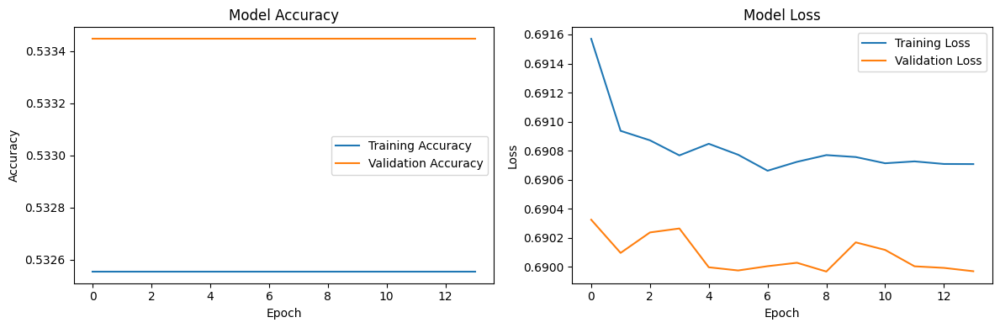

In [39]:
# Plot training history

plt.figure(figsize=(12, 4))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.legend()

plt.tight_layout()
plt.show()